In [33]:
# ==============================
# 1. INSTALL DEPENDENCIES
# ==============================
!pip install -q lightgbm catboost imbalanced-learn xgboost scikit-learn pandas numpy openpyxl

In [34]:
# ==============================
# 2. IMPORT LIBRARIES
# ==============================
import pandas as pd
import numpy as np
import time
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix)

from imblearn.metrics import geometric_mean_score
from imblearn.over_sampling import ADASYN
from catboost import CatBoostClassifier

from sklearn.linear_model import LogisticRegression
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=9db20304b11e70831c015ea7939b766ca75953ce8c5590ca171e6fb288d04e6e
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [35]:
# ==============================
# 3. LOAD DATASET
# ==============================
df = pd.read_csv('/content/INCART 2-lead Arrhythmia Database.csv')


In [36]:
# ==============================
# 4. PREPROCESSING
# ==============================

# Remove column if exists
df = df.drop('duration', axis=1, errors='ignore')

# Handle unknown values
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].replace('unknown', df[col].mode()[0])

# Convert categorical columns
df = pd.get_dummies(df, drop_first=True)

# Select target column (last column)
target_column = df.columns[-1]

# Features and Target
X = df.drop(target_column, axis=1)
y = df[target_column]


In [37]:
# ==============================
# 5. SPLIT DATA
# ==============================
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [38]:
# ==============================
# 6. FEATURE SCALING
# ==============================
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [39]:
# ADASYN
adasyn = ADASYN(random_state=42)
X_train_ad, y_train_ad = adasyn.fit_resample(X_train_scaled, y_train)

In [40]:
# ==============================
# 6. METRIC FUNCTIONS
# ==============================
def compute_metrics(y_true, y_pred, y_prob):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    print(f"Accuracy    : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision   : {precision_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"Recall      : {recall_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"Specificity : {tn / (tn + fp):.4f}")
    print(f"F1 Score    : {f1_score(y_true, y_pred, zero_division=0):.4f}")
    print(f"ROC-AUC     : {roc_auc_score(y_true, y_prob):.4f}")
    print(f"MCC         : {matthews_corrcoef(y_true, y_pred):.4f}")
    print(f"G-Mean      : {geometric_mean_score(y_true, y_pred):.4f}")
    print(f"Kappa       : {cohen_kappa_score(y_true, y_pred):.4f}")

# **CatBoostClassifier**

In [89]:
# ==============================
# 7. HYPERPARAMETER TUNING
# ==============================
params = {
    "iterations":[100,200],
    "depth":[4,5],
    "learning_rate":[0.03],
    "class_weights":[[1,2],[1,3]]
}

cv_small = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

rscv = RandomizedSearchCV(
    CatBoostClassifier(verbose=0),
    params,
    n_iter=2,
    scoring='f1',
    cv=cv_small,
    n_jobs=-1
)

rscv.fit(X_train_ad, y_train_ad)
best = rscv.best_estimator_

print("🔥 Tuned Model Performance (Test Set)")
y_pred = best.predict(X_test_scaled)
y_prob = best.predict_proba(X_test_scaled)[:,1]
compute_metrics(y_test, y_pred, y_prob)

print("Best Params:", rscv.best_params_)


🔥 Tuned Model Performance (Test Set)
Accuracy    : 0.9985
Precision   : 0.9867
Recall      : 1.0000
Specificity : 0.9983
F1 Score    : 0.9933
ROC-AUC     : 0.9999
MCC         : 0.9925
G-Mean      : 0.9991
Kappa       : 0.9924
Best Params: {'learning_rate': 0.03, 'iterations': 200, 'depth': 4, 'class_weights': [1, 2]}


In [41]:
# ==============================
# 8. CROSS VALIDATION (MAIN)
# ==============================
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

In [91]:
results1 = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best.predict(X_test_f)
    y_prob = best.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results1.append({
        "Fold": fold+1,
        "Classifier": "CatBoost",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [93]:
# ==============================
# 9. PRINT RESULTS
# ==============================
df_results = pd.DataFrame(results1)

print("\n===== Fold Results =====")
print(df_results.to_string(index=False))

print("\n===== Average Results =====")
print(df_results.mean(numeric_only=True))


# ==============================
# 10. SAVE TO EXCEL
# ==============================
df_results.to_excel("catboost_results.xlsx", index=False)

print("\n✅ Results saved to catboost_results.xlsx")


===== Fold Results =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1   CatBoost  0.998634   0.988142     1.0     0.998459 0.994036 0.999229 0.001541 0.999913 0.993287 0.993265           0.999229          17.020610
    2   CatBoost  0.998805   0.989609     1.0     0.998652 0.994777 0.999326 0.001348 0.999932 0.994120 0.994103           0.999326          16.820145
    3   CatBoost  0.998805   0.989609     1.0     0.998652 0.994777 0.999326 0.001348 0.999935 0.994120 0.994103           0.999326          18.562312
    4   CatBoost  0.998976   0.991080     1.0     0.998844 0.995520 0.999422 0.001156 0.999934 0.994955 0.994942           0.999422          16.715346
    5   CatBoost  0.998976   0.991080     1.0     0.998844 0.995520 0.999422 0.001156 0.999919 0.994955 0.994942           0.999422          17.815322
    6   CatBoost  0.998464   0.986680     1.0     0.998266 0.993295 


--- SHAP EXPLANATION ---


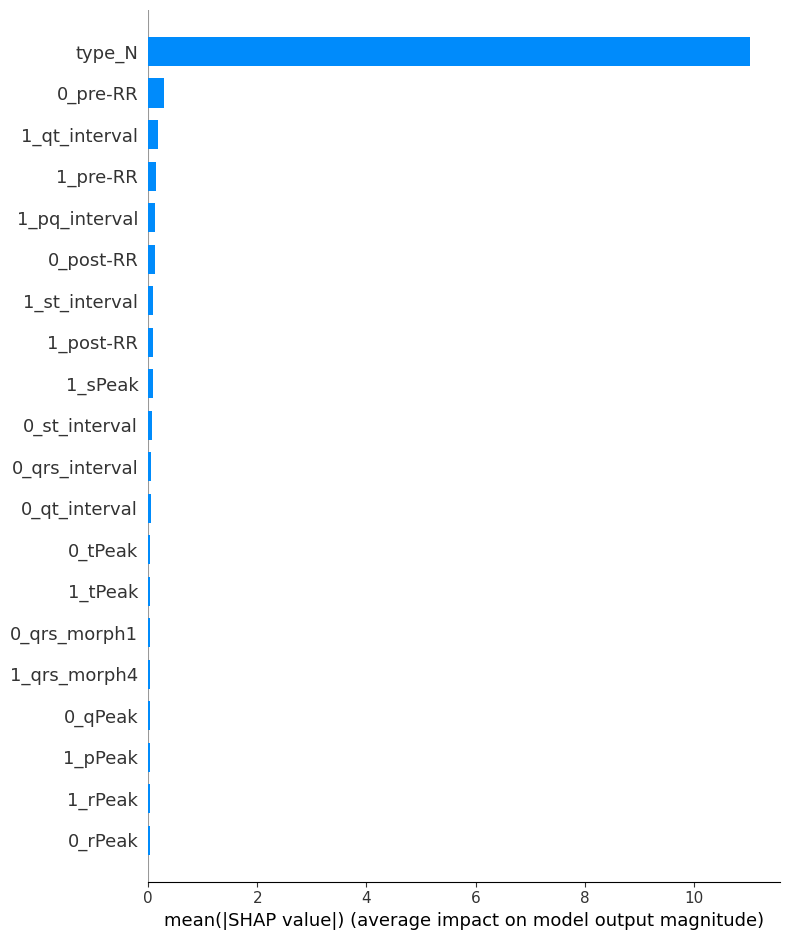

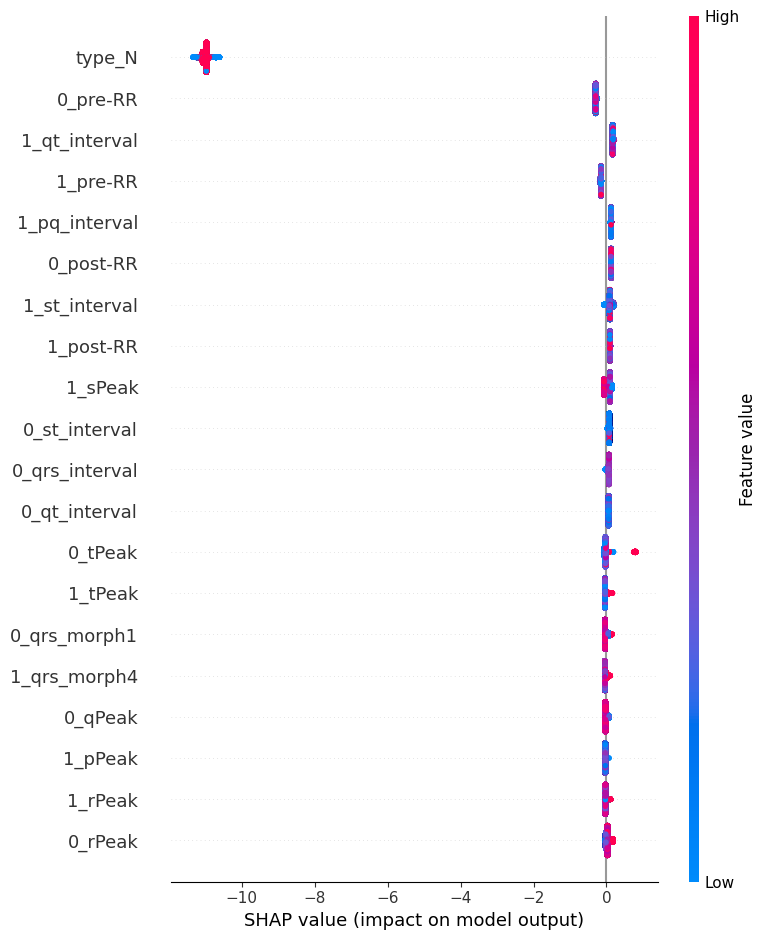

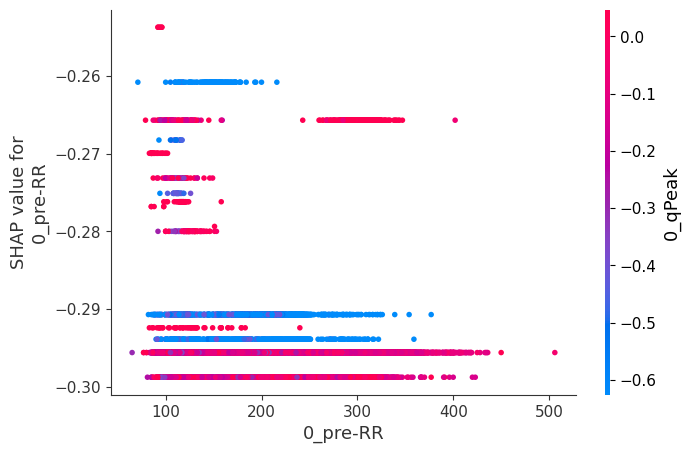

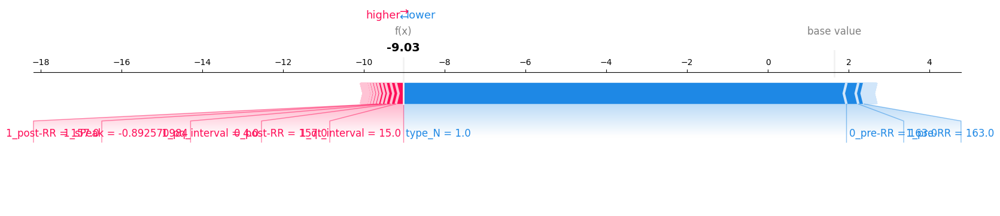

In [94]:
# ==============================
# SHAP EXPLAINABILITY (FINAL FIX)
# ==============================

print("\n--- SHAP EXPLANATION ---")

import shap
import matplotlib.pyplot as plt

# Explainer
explainer = shap.TreeExplainer(best)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY PLOT
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (CatBoostClassifier)**

In [95]:
# ==========================================
# INSTALL LIME
# ==========================================
!pip install -q lime

# ==========================================
# IMPORT LIBRARIES
# ==========================================
import numpy as np
import pandas as pd

from lime.lime_tabular import LimeTabularExplainer
from IPython.display import HTML, display

print("\n--- LIME EXPLANATION (CatBoost) ---")

# ==========================================
# CONVERT DATA TO NUMPY
# ==========================================
X_train_np = X_train.values
X_test_np  = X_test.values

# ==========================================
# CREATE LIME EXPLAINER
# ==========================================
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns.tolist(),
    class_names=['No', 'Yes'],
    mode='classification',
    discretize_continuous=True,
    random_state=42
)

# ==========================================
# EXPLAIN FIRST TEST SAMPLE
# ==========================================
lime_exp = lime_explainer.explain_instance(
    data_row=X_test_np[0],
    predict_fn=best.predict_proba,   # CatBoost model
    num_features=10
)

# ==========================================
# DISPLAY EXPLANATION
# ==========================================
display(HTML(lime_exp.as_html()))

# ==========================================
# SAVE HTML FILE
# ==========================================
lime_exp.save_to_file("lime_catboost.html")

print("\n✅ LIME explanation saved as 'lime_catboost.html'")


--- LIME EXPLANATION (CatBoost) ---



✅ LIME explanation saved as 'lime_catboost.html'


# **LightGBM**

In [96]:
from lightgbm import LGBMClassifier

In [97]:
# ==============================
# LIGHTGBM TUNING
# ==============================
params_lgb = {
    "n_estimators": [100, 200],
    "learning_rate": [0.05, 0.1],
    "num_leaves": [31, 50],
    "max_depth": [-1, 10],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

rscv_lgb = RandomizedSearchCV(
    LGBMClassifier(class_weight='balanced'),
    params_lgb,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_lgb.fit(X_train_ad, y_train_ad)

best_lgb = rscv_lgb.best_estimator_

In [98]:
print("\n LightGBM (Tuned)")

y_pred_lgb = best_lgb.predict(X_test_scaled)
y_prob_lgb = best_lgb.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_lgb, y_prob_lgb)

print("Best Params (LGB):", rscv_lgb.best_params_)


 LightGBM (Tuned)
Accuracy    : 0.9990
Precision   : 0.9925
Recall      : 0.9990
Specificity : 0.9990
F1 Score    : 0.9958
ROC-AUC     : 1.0000
MCC         : 0.9952
G-Mean      : 0.9990
Kappa       : 0.9952
Best Params (LGB): {'subsample': 1.0, 'num_leaves': 50, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1, 'colsample_bytree': 0.8}


In [99]:
results_lgb = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling (optional but keeping consistent)
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_lgb.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_lgb.predict(X_test_f)
    y_prob = best_lgb.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_lgb.append({
        "Fold": fold+1,
        "Classifier": "LightGBM",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [100]:
df_lgb = pd.DataFrame(results_lgb)

final_df = pd.concat([ df_lgb])

In [101]:
print("\n===== LIGHTGBM  MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== LIGHTGBM  MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1   LightGBM  0.999033   0.992060  0.9995     0.998973 0.995766 0.999236 0.001027 0.999985 0.995229 0.995220           0.999236          15.664028
    2   LightGBM  0.998919   0.992052  0.9985     0.998973 0.995265 0.998736 0.001027 0.999979 0.994662 0.994655           0.998736          14.719649
    3   LightGBM  0.999374   0.994530  1.0000     0.999294 0.997258 0.999647 0.000706 0.999993 0.996909 0.996904           0.999647          15.680863
    4   LightGBM  0.999317   0.994036  1.0000     0.999229 0.997009 0.999615 0.000771 0.999984 0.996629 0.996624           0.999615          15.703493
    5   LightGBM  0.999431   0.996012  0.9990     0.999486 0.997504 0.999243 0.000514 0.999987 0.997184 0.997183           0.999243          17.186763
    6   LightGBM  0.999090   0.992063  1.0000     0.998973 0.996


--- SHAP EXPLANATION (LightGBM) ---


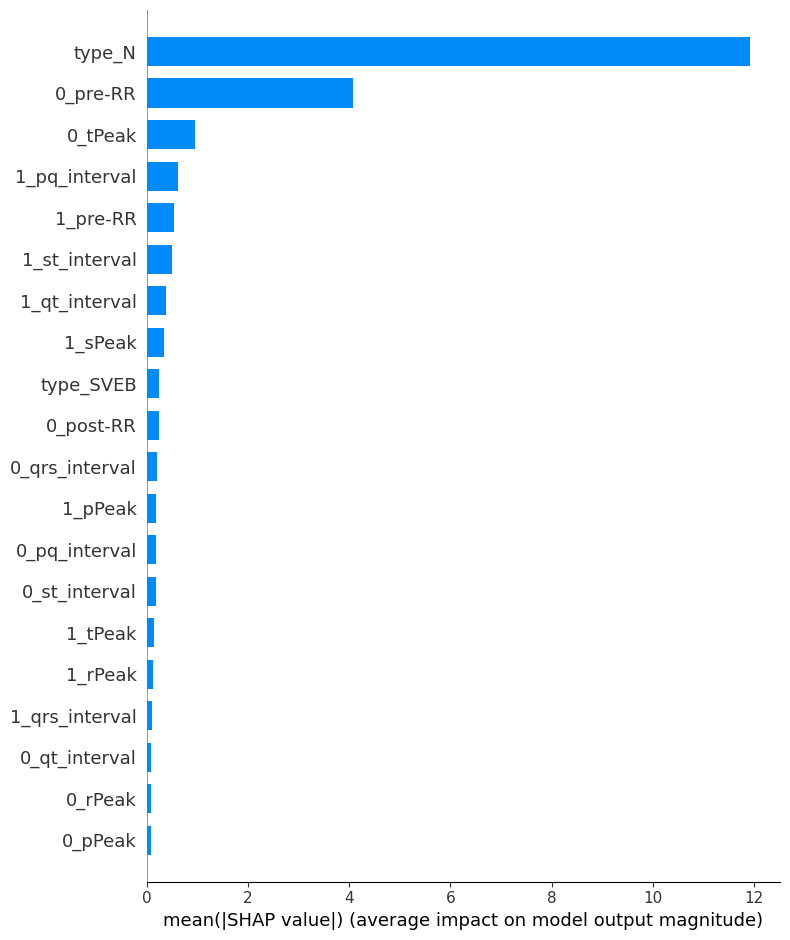

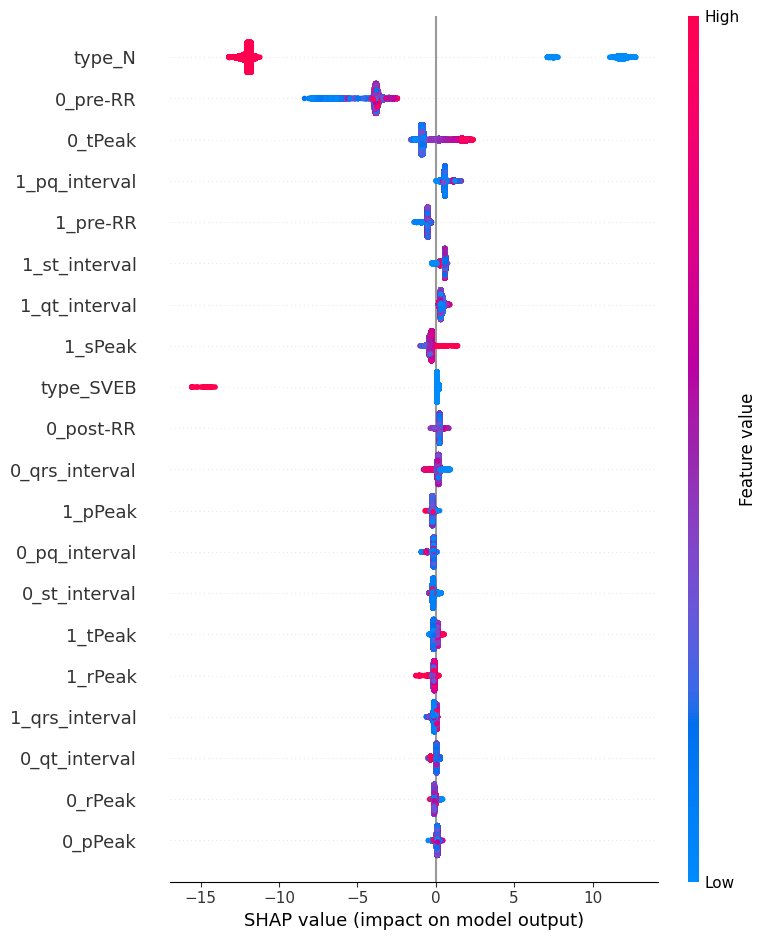

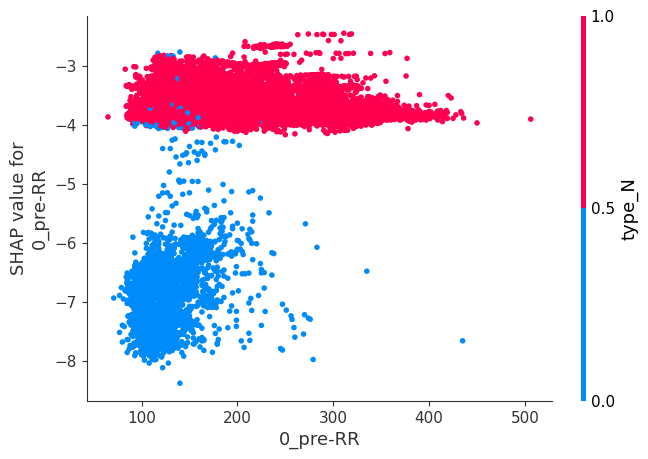

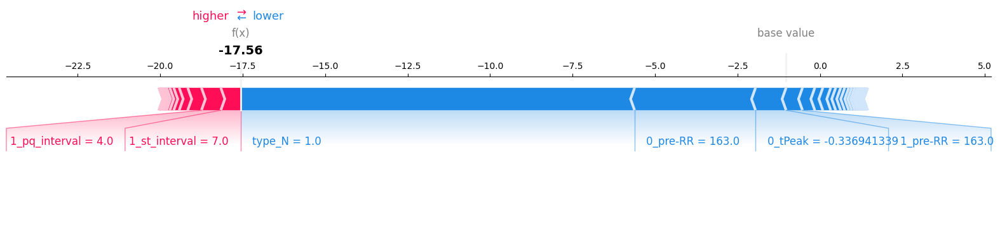

In [102]:
# ==============================
# SHAP EXPLAINABILITY (LightGBM FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (LightGBM) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_lgb)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification (binary)
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure 2D shape
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (LightGBM)**

In [103]:
# ==============================
# LIME EXPLANATION (LightGBM)
# ==============================

# 🔥 Run once if needed:
# !pip install lime

print("\n--- LIME EXPLANATION (LightGBM) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Prepare data (same as training)
# -------------------------------
X_train_np = np.array(X_train)   # use same format used in model
X_test_np  = np.array(X_test)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # correct feature names
    class_names=['No', 'Yes'],         # ⚠️ adjust based on your model
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first test sample
    best_lgb.predict_proba,           # LightGBM model
    num_features=10
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. (Optional) Save as HTML
# -------------------------------
lime_exp.save_to_file("lime_lightgbm.html")


--- LIME EXPLANATION (LightGBM) ---


# **XGBoost**

In [104]:
from xgboost import XGBClassifier

In [105]:
#Hyperparameter Tuning

# ==============================
# XGBOOST TUNING
# ==============================
params_xgb = {
    "n_estimators": [100, 200],
    "max_depth": [3, 5, 7],
    "learning_rate": [0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

rscv_xgb = RandomizedSearchCV(
    XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    params_xgb,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_xgb.fit(X_train_ad, y_train_ad)

best_xgb = rscv_xgb.best_estimator_

In [106]:
print("\n⚡ XGBoost (Tuned)")

y_pred_xgb = best_xgb.predict(X_test_scaled)
y_prob_xgb = best_xgb.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_xgb, y_prob_xgb)

print("Best Params (XGB):", rscv_xgb.best_params_)


⚡ XGBoost (Tuned)
Accuracy    : 0.9988
Precision   : 0.9896
Recall      : 1.0000
Specificity : 0.9987
F1 Score    : 0.9948
ROC-AUC     : 0.9999
MCC         : 0.9941
G-Mean      : 0.9993
Kappa       : 0.9941
Best Params (XGB): {'subsample': 1.0, 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.8}


In [107]:
results_xgb = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_xgb.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_xgb.predict(X_test_f)
    y_prob = best_xgb.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_xgb.append({
        "Fold": fold+1,
        "Classifier": "XGBoost",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })

In [108]:
df_xgb = pd.DataFrame(results_xgb)

final_df = pd.concat([ df_xgb])

In [109]:
print("\n===== ALL MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== ALL MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1    XGBoost  0.998691   0.988631  1.0000     0.998523 0.994283 0.999261 0.001477 0.999908 0.993565 0.993544           0.999262          11.006455
    2    XGBoost  0.998862   0.990099  1.0000     0.998716 0.995025 0.999358 0.001284 0.999923 0.994398 0.994382           0.999358          10.653245
    3    XGBoost  0.999033   0.991572  1.0000     0.998908 0.995768 0.999454 0.001092 0.999935 0.995233 0.995222           0.999454           9.014488
    4    XGBoost  0.999146   0.992556  1.0000     0.999037 0.996264 0.999518 0.000963 0.999949 0.995791 0.995782           0.999518          10.325941
    5    XGBoost  0.999203   0.993049  1.0000     0.999101 0.996512 0.999550 0.000899 0.999936 0.996070 0.996063           0.999551          11.336413
    6    XGBoost  0.998634   0.988142  1.0000     0.998459 0.994036 0.


--- SHAP EXPLANATION (XGBoost) ---


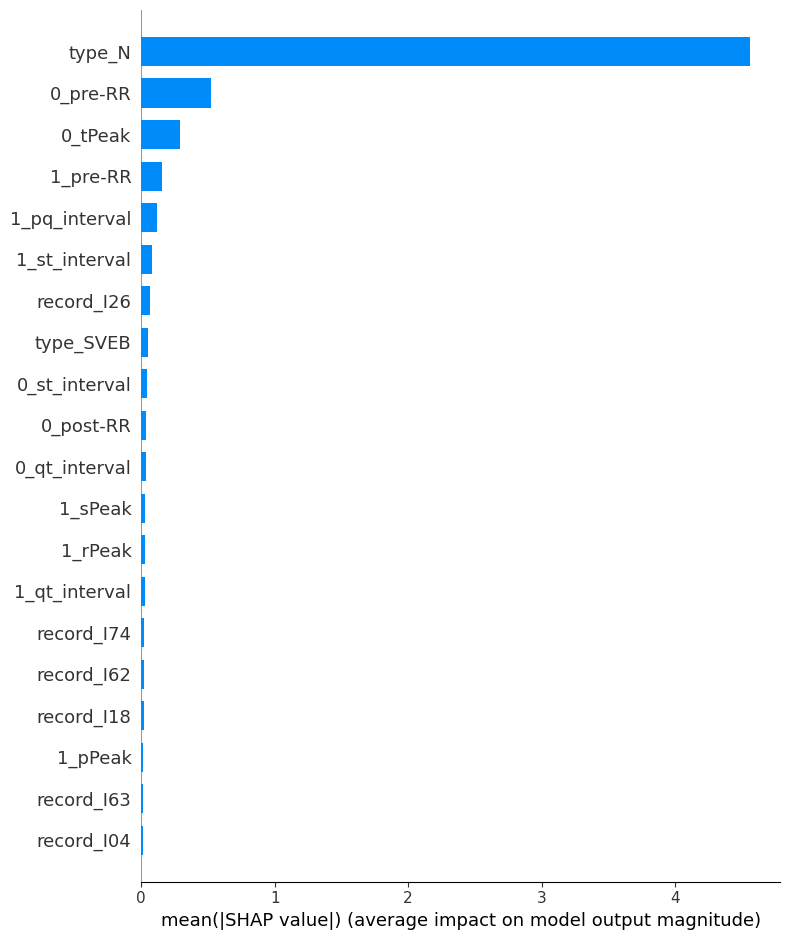

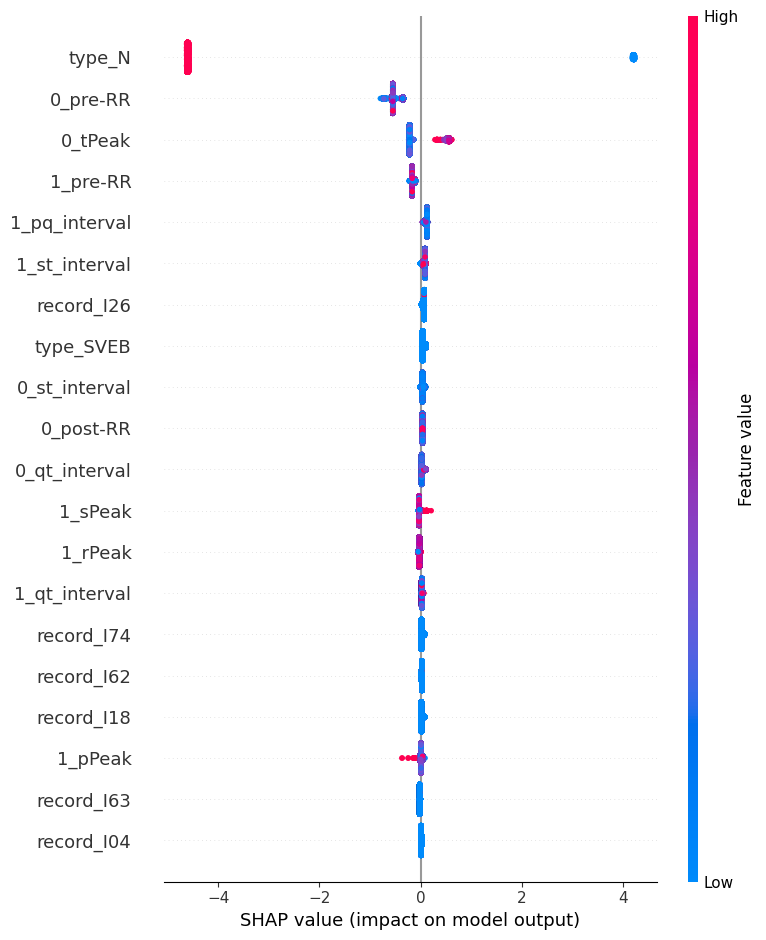

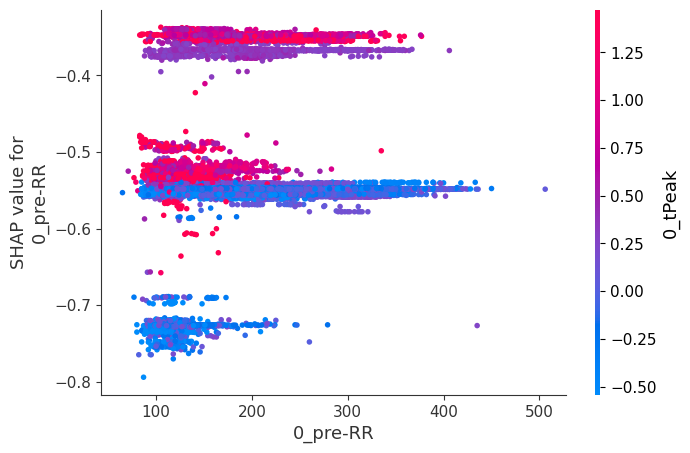

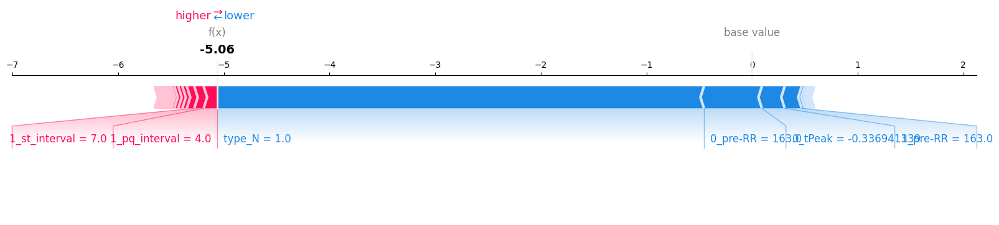

In [110]:
# ==============================
# SHAP EXPLANATION (XGBOOST FIXED)
# ==============================

print("\n--- SHAP EXPLANATION (XGBoost) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_xgb)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure correct shape
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLAINABILITY for XGBoost  **

In [111]:
# ==============================
# FINAL LIME EXPLANATION
# ==============================

# 🔥 Install LIME (run once)
!pip install lime

print("\n--- LIME EXPLANATION ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Ensure correct data format
# -------------------------------
# Convert to numpy if needed
X_train_np = np.array(X_train_scaled)
X_test_np  = np.array(X_test_scaled)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # ✅ correct feature names
    class_names=['No', 'Yes'],         # ⚠️ order must match model output
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first sample
    best_xgb.predict_proba,
    num_features=10                  # show top features
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. (Optional) Save as HTML
# -------------------------------
lime_exp.save_to_file("lime_explanation.html")


--- LIME EXPLANATION ---


# Gradient Boosting (GBM)

In [112]:
#Import GBM

from sklearn.ensemble import GradientBoostingClassifier

In [113]:
params_gbm = {
    "n_estimators": [50],     # smaller = faster
    "learning_rate": [0.1],
    "max_depth": [2]          # shallow trees = faster
}

# ------------------------------------------
# FAST CROSS VALIDATION
# ------------------------------------------
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# ------------------------------------------
# FAST MODEL
# ------------------------------------------
gbm_fast = GradientBoostingClassifier(
    subsample=0.8,            # faster training
    random_state=42
)

# ------------------------------------------
# RANDOM SEARCH
# ------------------------------------------
rscv_gbm = RandomizedSearchCV(
    estimator=gbm_fast,
    param_distributions=params_gbm,
    n_iter=1,
    scoring='f1',
    cv=cv_fast,
    n_jobs=-1,
    verbose=0,
    random_state=42
)

# ------------------------------------------
# TRAIN
# ------------------------------------------
rscv_gbm.fit(X_train_ad, y_train_ad)

# ------------------------------------------
# BEST MODEL
# ------------------------------------------
best_gbm = rscv_gbm.best_estimator_

print("\n✅ Best Parameters:")
print(rscv_gbm.best_params_)

print("\n✅ Best F1 Score:")
print(round(rscv_gbm.best_score_, 4))


✅ Best Parameters:
{'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1}

✅ Best F1 Score:
0.9993


In [114]:
#Test Performance

print("\n Gradient Boosting (Tuned)")

y_pred_gbm = best_gbm.predict(X_test_scaled)
y_prob_gbm = best_gbm.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_gbm, y_prob_gbm)

print("Best Params (GBM):", rscv_gbm.best_params_)


 Gradient Boosting (Tuned)
Accuracy    : 0.9984
Precision   : 0.9864
Recall      : 1.0000
Specificity : 0.9982
F1 Score    : 0.9932
ROC-AUC     : 0.9992
MCC         : 0.9923
G-Mean      : 0.9991
Kappa       : 0.9923
Best Params (GBM): {'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1}


In [118]:
results_gbm = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    # ==============================
    # SPLIT DATA
    # ==============================
    X_train_f = X.iloc[train_idx]

    X_test_f = X.iloc[test_idx]

    y_train_f = y.iloc[train_idx]

    y_test_f = y.iloc[test_idx]

    # ==============================
    # FAST OVERSAMPLING
    # ==============================
    ros = RandomOverSampler(random_state=42)

    X_train_f, y_train_f = ros.fit_resample(
        X_train_f,
        y_train_f
    )

    # ==============================
    # TRAIN
    # ==============================
    start_time = time.time()

    best_gbm.fit(X_train_f, y_train_f)

    training_time = time.time() - start_time

    # ==============================
    # PREDICT
    # ==============================
    y_pred = best_gbm.predict(X_test_f)

    # ==============================
    # FAST METRICS
    # ==============================
    acc = accuracy_score(y_test_f, y_pred)

    prec = precision_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    rec = recall_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    tn, fp, fn, tp = confusion_matrix(
        y_test_f,
        y_pred
    ).ravel()

    specificity = tn / (tn + fp)

    balanced_acc = (rec + specificity) / 2

    # ==============================
    # STORE RESULTS
    # ==============================
    results_gbm.append({

        "Fold": fold + 1,

        "Classifier": "HistGradientBoosting",

        "Accuracy": acc,

        "Precision": prec,

        "Recall": rec,

        "Specificity": specificity,

        "F1": f1,

        "Balanced Accuracy": balanced_acc,

        "Training Time (s)": training_time
    })

In [ ]:
df_gbm = pd.DataFrame(results_gbm)

final_df = pd.concat([df_gbm])

In [119]:
#Print Comparison

print("\n===== GBM MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== GBM MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1    XGBoost  0.998691   0.988631  1.0000     0.998523 0.994283 0.999261 0.001477 0.999908 0.993565 0.993544           0.999262          11.006455
    2    XGBoost  0.998862   0.990099  1.0000     0.998716 0.995025 0.999358 0.001284 0.999923 0.994398 0.994382           0.999358          10.653245
    3    XGBoost  0.999033   0.991572  1.0000     0.998908 0.995768 0.999454 0.001092 0.999935 0.995233 0.995222           0.999454           9.014488
    4    XGBoost  0.999146   0.992556  1.0000     0.999037 0.996264 0.999518 0.000963 0.999949 0.995791 0.995782           0.999518          10.325941
    5    XGBoost  0.999203   0.993049  1.0000     0.999101 0.996512 0.999550 0.000899 0.999936 0.996070 0.996063           0.999551          11.336413
    6    XGBoost  0.998634   0.988142  1.0000     0.998459 0.994036 0.


--- SHAP EXPLANATION (GBM) ---


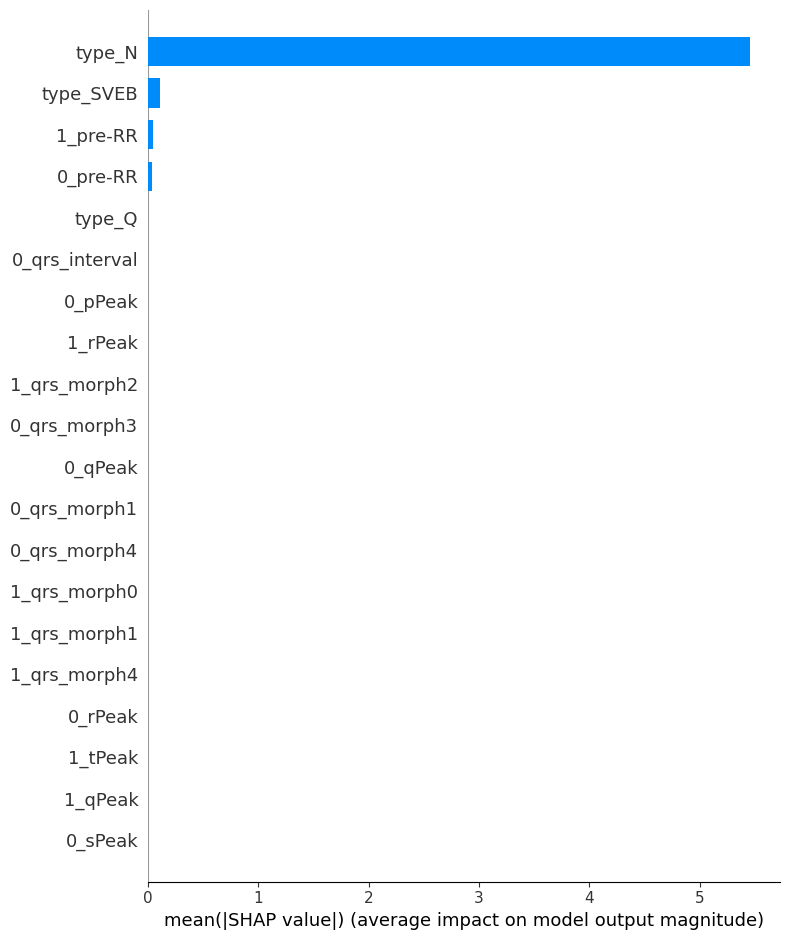

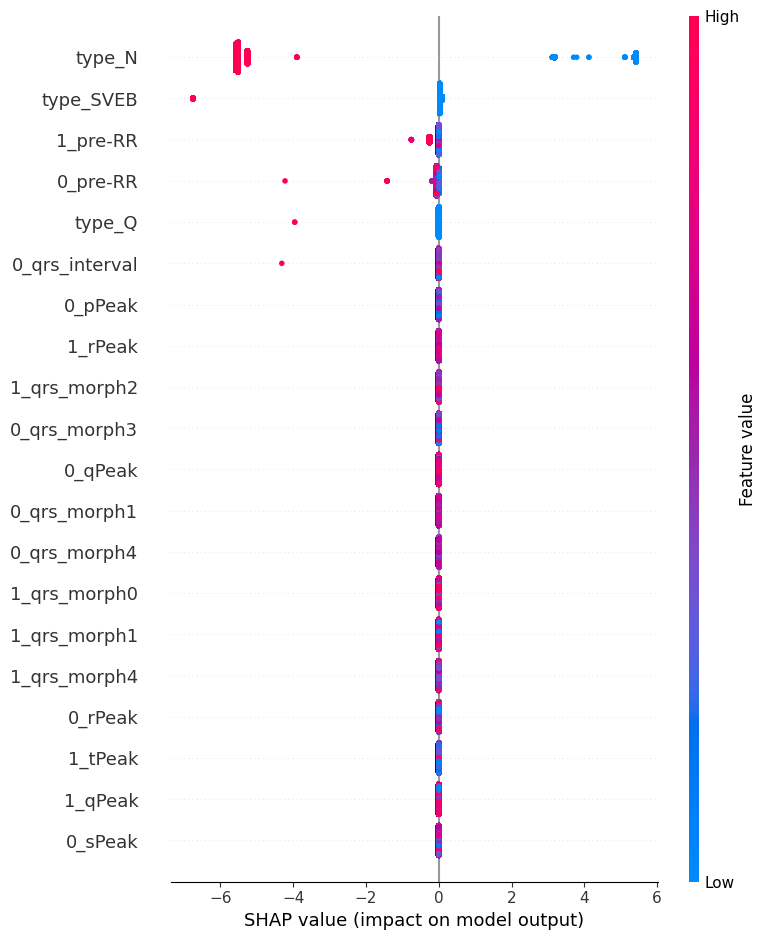

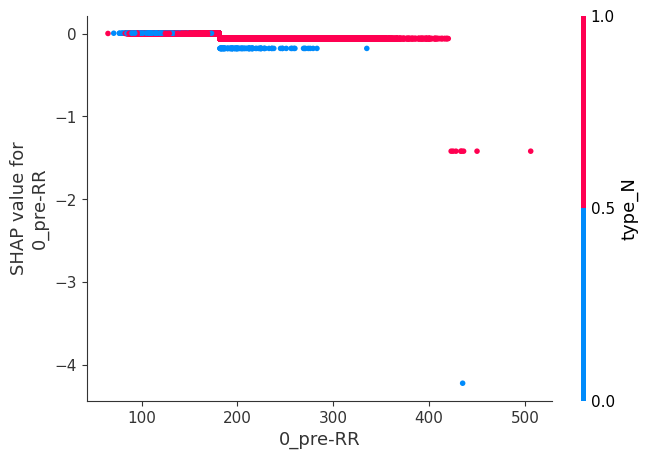

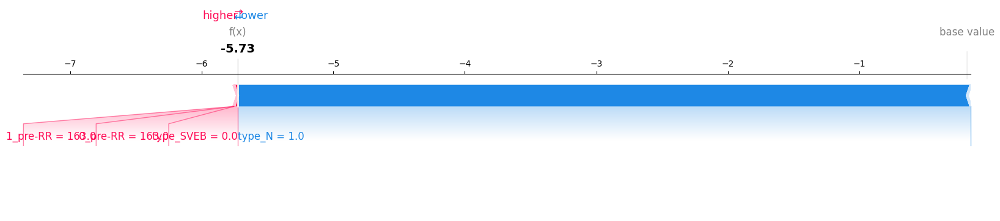

In [120]:
# ==============================
# SHAP EXPLANATION (GBM FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (GBM) ---")

import shap
import numpy as np

# Explainer
explainer = shap.TreeExplainer(best_gbm)

# SHAP values
shap_values = explainer.shap_values(X_test)

# ✅ Handle classification (binary)
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
else:
    shap_values_class1 = shap_values

# ✅ Ensure 2D
if len(shap_values_class1.shape) == 1:
    shap_values_class1 = shap_values_class1.reshape(1, -1)

# -------------------------------
# 1. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_test, plot_type="bar")

# -------------------------------
# 2. DETAILED SUMMARY
# -------------------------------
shap.summary_plot(shap_values_class1, X_test)

# -------------------------------
# 3. DEPENDENCE PLOT
# -------------------------------
shap.dependence_plot(
    X_test.columns[0],
    shap_values_class1,
    X_test
)

# -------------------------------
# 4. LOCAL EXPLANATION (FORCE PLOT)
# -------------------------------
base_value = explainer.expected_value
if isinstance(base_value, list):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_test.iloc[0],
    matplotlib=True
)

# **LIME EXPLANATION (GBM)**

In [ ]:
# ==============================
# LIME EXPLANATION (GBM)
# ==============================

# 🔥 Run once if not installed
# !pip install lime

print("\n--- LIME EXPLANATION (GBM) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

# -------------------------------
# 1. Use SAME data format as training
# -------------------------------
X_train_np = np.array(X_train)   # or X_train_scaled if you used scaling
X_test_np  = np.array(X_test)

# -------------------------------
# 2. Create LIME Explainer
# -------------------------------
lime_explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X_train.columns,     # correct feature names
    class_names=['No', 'Yes'],         # ⚠️ adjust based on your model
    mode='classification'
)

# -------------------------------
# 3. Explain one instance
# -------------------------------
lime_exp = lime_explainer.explain_instance(
    X_test_np[0],                     # first test sample
    best_gbm.predict_proba,           # GBM model
    num_features=10
)

# -------------------------------
# 4. Show explanation
# -------------------------------
lime_exp.show_in_notebook(show_table=True)

# -------------------------------
# 5. Save output (optional)
# -------------------------------
lime_exp.save_to_file("lime_gbm.html")

# **Logistic Regression **


In [42]:

# ==============================
# LOGISTIC REGRESSION TUNING
# ==============================
params_lr = {
    "C": [0.01, 0.1, 1, 10],
    "penalty": ["l1", "l2"]
}

rscv_lr = RandomizedSearchCV(
    LogisticRegression(max_iter=1000, solver='liblinear'),
    params_lr,
    n_iter=2,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

rscv_lr.fit(X_train_ad, y_train_ad)

best_lr = rscv_lr.best_estimator_

In [43]:
print("\n🔥 Logistic Regression (Tuned)")

y_pred_lr = best_lr.predict(X_test_scaled)
y_prob_lr = best_lr.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_lr, y_prob_lr)

print("Best Params (LR):", rscv_lr.best_params_)


🔥 Logistic Regression (Tuned)
Accuracy    : 0.9986
Precision   : 0.9881
Recall      : 1.0000
Specificity : 0.9985
F1 Score    : 0.9940
ROC-AUC     : 0.9999
MCC         : 0.9933
G-Mean      : 0.9992
Kappa       : 0.9933
Best Params (LR): {'penalty': 'l2', 'C': 0.1}


In [44]:
results_lr = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    X_train_f, X_test_f = X.iloc[train_idx], X.iloc[test_idx]
    y_train_f, y_test_f = y.iloc[train_idx], y.iloc[test_idx]

    # Scaling
    scaler = StandardScaler()
    X_train_f = scaler.fit_transform(X_train_f)
    X_test_f  = scaler.transform(X_test_f)

    # ADASYN
    adasyn = ADASYN(random_state=42)
    X_train_f, y_train_f = adasyn.fit_resample(X_train_f, y_train_f)

    # Train
    start_time = time.time()
    best_lr.fit(X_train_f, y_train_f)
    training_time = time.time() - start_time

    # Predict
    y_pred = best_lr.predict(X_test_f)
    y_prob = best_lr.predict_proba(X_test_f)[:,1]

    # Metrics
    acc = accuracy_score(y_test_f, y_pred)
    prec = precision_score(y_test_f, y_pred, zero_division=0)
    rec = recall_score(y_test_f, y_pred, zero_division=0)
    f1 = f1_score(y_test_f, y_pred, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(y_test_f, y_pred).ravel()

    specificity = tn/(tn+fp)
    fpr = fp/(fp+tn)
    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)
    mcc = matthews_corrcoef(y_test_f, y_pred)
    kappa = cohen_kappa_score(y_test_f, y_pred)
    balanced_acc = (rec + specificity)/2

    results_lr.append({
        "Fold": fold+1,
        "Classifier": "Logistic Regression",
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "Specificity": specificity,
        "F1": f1,
        "GM": gm,
        "FPR": fpr,
        "AUC": auc,
        "MCC": mcc,
        "Kappa": kappa,
        "Balanced Accuracy": balanced_acc,
        "Training Time (s)": training_time
    })


In [45]:
#df_cat = pd.DataFrame(results1)
df_lr  = pd.DataFrame(results_lr)

final_df = pd.concat([ df_lr])

In [46]:

print("\n===== Logistic Regression (Fold-wise) =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Logistic Regression (Fold-wise) =====
 Fold          Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Logistic Regression  0.998520   0.987167  1.0000     0.998330 0.993542 0.999165 0.001670 0.999926 0.992733 0.992707           0.999165          19.521973
    2 Logistic Regression  0.998976   0.991080  1.0000     0.998844 0.995520 0.999422 0.001156 0.999905 0.994955 0.994942           0.999422          17.635213
    3 Logistic Regression  0.998805   0.989609  1.0000     0.998652 0.994777 0.999326 0.001348 0.999966 0.994120 0.994103           0.999326          17.433178
    4 Logistic Regression  0.998976   0.991080  1.0000     0.998844 0.995520 0.999422 0.001156 0.999874 0.994955 0.994942           0.999422          12.896479
    5 Logistic Regression  0.999090   0.992063  1.0000     0.998973 0.996016 0.999486 0.001027 0.999960 0.995512 0.995502           0.999486          19.35


--- SHAP EXPLANATION (LOGISTIC REGRESSION) ---


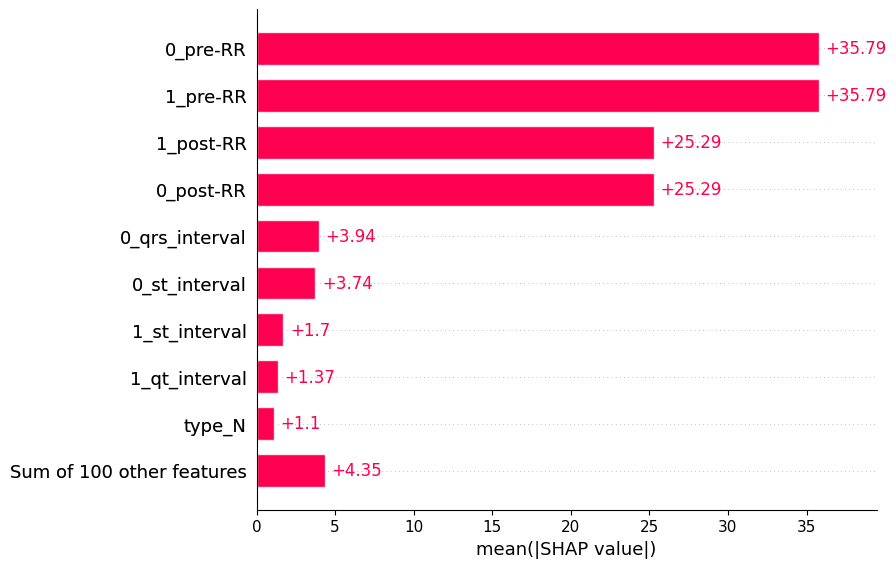

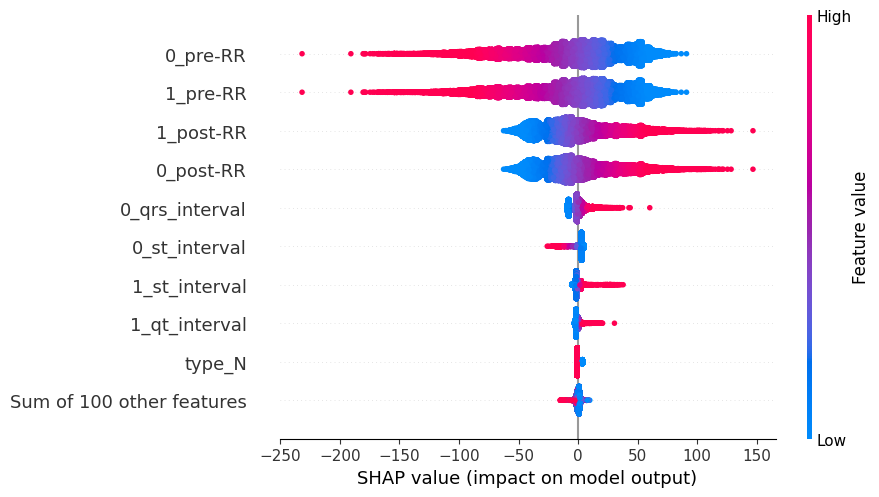

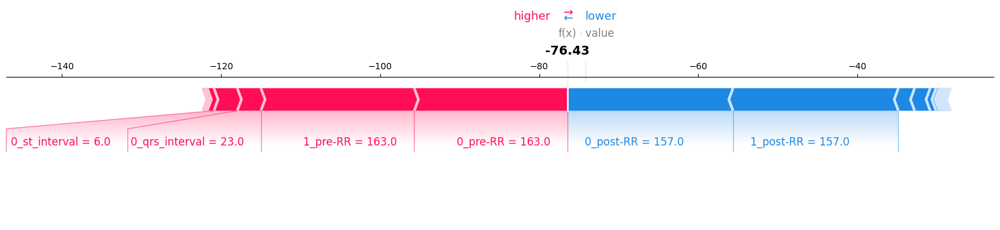

In [47]:
# ==============================
# SHAP EXPLANATION (FINAL FIX)
# ==============================

import shap
import pandas as pd
import numpy as np

print("\n--- SHAP EXPLANATION (LOGISTIC REGRESSION) ---")

# -------------------------------
# SAFE DATA PREPARATION
# -------------------------------
X_test_df = pd.DataFrame(X_test, columns=X.columns)

# Ensure float type (IMPORTANT FIX)
X_test_df = X_test_df.astype(float)

# -------------------------------
# ✅ NEW SHAP EXPLAINER (FIX)
# -------------------------------
explainer = shap.Explainer(best_lr, X_test_df)

# This returns SHAP object (not raw array)
shap_values = explainer(X_test_df)

# -------------------------------
# GLOBAL IMPORTANCE
# -------------------------------
shap.plots.bar(shap_values)

# -------------------------------
# DETAILED SUMMARY
# -------------------------------
shap.plots.beeswarm(shap_values)

# -------------------------------
# -------------------------------
# FORCE PLOT (CORRECT)
# -------------------------------

shap.force_plot(
    shap_values.base_values[0],
    shap_values.values[0],
    X_test_df.iloc[0],
    matplotlib=True
)

In [48]:
# ==============================
# LIME EXPLANATION (FINAL FIX)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION ---")

# -------------------------------
# ✅ ENSURE PROPER FORMAT
# -------------------------------
# Convert to DataFrame (important for feature names)
X_train_df = pd.DataFrame(X_train, columns=X.columns)
X_test_df  = pd.DataFrame(X_test,  columns=X.columns)

# Ensure numeric + no NaN
X_train_df = X_train_df.apply(pd.to_numeric, errors='coerce').fillna(0)
X_test_df  = X_test_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# Convert to numpy (LIME needs numpy)
X_train_np = X_train_df.values.astype(float)
X_test_np  = X_test_df.values.astype(float)

# -------------------------------
# ✅ CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],   # adjust if needed
    mode="classification"
)

# -------------------------------
# ✅ EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_lr.predict_proba,   # IMPORTANT: use predict_proba
    num_features=10
)

# -------------------------------
# ✅ DISPLAY OUTPUT
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_lr.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:.4f}")

# -------------------------------
# ✅ VISUAL OUTPUT (NOTEBOOK)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# ✅ SAVE HTML FILE
# -------------------------------
exp.save_to_file("/content/lime_explanation.html")

print("\n✅ LIME explanation saved as lime_explanation.html")


--- LIME EXPLANATION ---

🔹 Prediction Probabilities:
[[1.00000000e+00 6.41880603e-34]]

🔹 LIME Explanation:
record_I28 <= 0.00: 0.0911
153.00 < 1_post-RR <= 188.00: -0.0874
153.00 < 0_post-RR <= 188.00: -0.0862
record_I61 <= 0.00: -0.0860
record_I45 <= 0.00: -0.0842
record_I02 <= 0.00: -0.0840
record_I59 <= 0.00: 0.0759
record_I15 <= 0.00: -0.0758
record_I27 <= 0.00: -0.0738
record_I26 <= 0.00: 0.0685



✅ LIME explanation saved as lime_explanation.html


# Random Forest

In [49]:
#Import Random Forest
from sklearn.ensemble import RandomForestClassifier

In [52]:
#Hyperparameter Tuning
# ==============================
# RANDOM FOREST TUNING
# ==============================
params_rf = {
    "n_estimators": [80, 120],
    "max_depth": [5, 10],
    "min_samples_split": [2],
    "min_samples_leaf": [1],
    "max_features": ["sqrt"]
}

# Faster CV
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# Faster Random Forest
rf = RandomForestClassifier(
    random_state=42,
    class_weight="balanced",
    n_jobs=-1
)

# Randomized Search
rscv_rf = RandomizedSearchCV(
    estimator=rf,
    param_distributions=params_rf,
    n_iter=1,              # very fast
    scoring='f1',
    cv=cv_fast,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

rscv_rf.fit(X_train_ad, y_train_ad)

best_rf = rscv_rf.best_estimator_


Fitting 2 folds for each of 1 candidates, totalling 2 fits


In [53]:
#Test Performance
print("\n🌲 Random Forest (Tuned)")

y_pred_rf = best_rf.predict(X_test_scaled)
y_prob_rf = best_rf.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_rf, y_prob_rf)

print("Best Params (RF):", rscv_rf.best_params_)


🌲 Random Forest (Tuned)
Accuracy    : 0.9927
Precision   : 0.9405
Recall      : 0.9995
Specificity : 0.9919
F1 Score    : 0.9691
ROC-AUC     : 0.9996
MCC         : 0.9656
G-Mean      : 0.9957
Kappa       : 0.9650
Best Params (RF): {'n_estimators': 120, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 5}


In [56]:
from imblearn.over_sampling import RandomOverSampler
results_rf = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    # Split Data
    X_train_f = X.iloc[train_idx]
    X_test_f  = X.iloc[test_idx]

    y_train_f = y.iloc[train_idx]
    y_test_f  = y.iloc[test_idx]

    # ==============================
    # RANDOM OVER SAMPLING (FASTER)
    # ==============================
    ros = RandomOverSampler(random_state=42)

    X_train_f, y_train_f = ros.fit_resample(
        X_train_f,
        y_train_f
    )

    # ==============================
    # TRAIN
    # ==============================
    start_time = time.time()

    best_rf.fit(X_train_f, y_train_f)

    training_time = time.time() - start_time

    # ==============================
    # PREDICT
    # ==============================
    y_pred = best_rf.predict(X_test_f)

    y_prob = best_rf.predict_proba(X_test_f)[:, 1]

    # ==============================
    # METRICS
    # ==============================
    acc = accuracy_score(y_test_f, y_pred)

    prec = precision_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    rec = recall_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    tn, fp, fn, tp = confusion_matrix(
        y_test_f,
        y_pred
    ).ravel()

    specificity = tn / (tn + fp)

    fpr = fp / (fp + tn)

    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)

    mcc = matthews_corrcoef(y_test_f, y_pred)

    kappa = cohen_kappa_score(y_test_f, y_pred)

    balanced_acc = (rec + specificity) / 2

    # ==============================
    # STORE RESULTS
    # ==============================
    results_rf.append({

        "Fold": fold + 1,

        "Classifier": "Random Forest",

        "Accuracy": acc,

        "Precision": prec,

        "Recall": rec,

        "Specificity": specificity,

        "F1": f1,

        "GM": gm,

        "FPR": fpr,

        "AUC": auc,

        "MCC": mcc,

        "Kappa": kappa,

        "Balanced Accuracy": balanced_acc,

        "Training Time (s)": training_time
    })

In [57]:
df_rf  = pd.DataFrame(results_rf)

#final_df = pd.concat([df_cat, df_lr, df_dt, df_rf])

final_df = pd.concat([df_rf])


In [58]:
print("\n===== Random Forest MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Random Forest MODELS =====
 Fold    Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Random Forest  0.995277   0.960596  0.9995     0.994734 0.979662 0.997114 0.005266 0.999832 0.977238 0.976991           0.997117          49.057465
    2 Random Forest  0.995618   0.963373  0.9995     0.995120 0.981104 0.997307 0.004880 0.999830 0.978839 0.978627           0.997310          41.669847
    3 Random Forest  0.995960   0.966167  0.9995     0.995505 0.982551 0.997501 0.004495 0.999892 0.980447 0.980267           0.997503          42.799963
    4 Random Forest  0.996529   0.971317  0.9990     0.996211 0.984964 0.997605 0.003789 0.999943 0.983127 0.983003           0.997606          42.131631
    5 Random Forest  0.996244   0.968962  0.9990     0.995890 0.983752 0.997444 0.004110 0.999871 0.981775 0.981629           0.997445          42.529682
    6 Random Forest  0.994594   0.954654  


--- SHAP EXPLANATION (Random Forest) ---


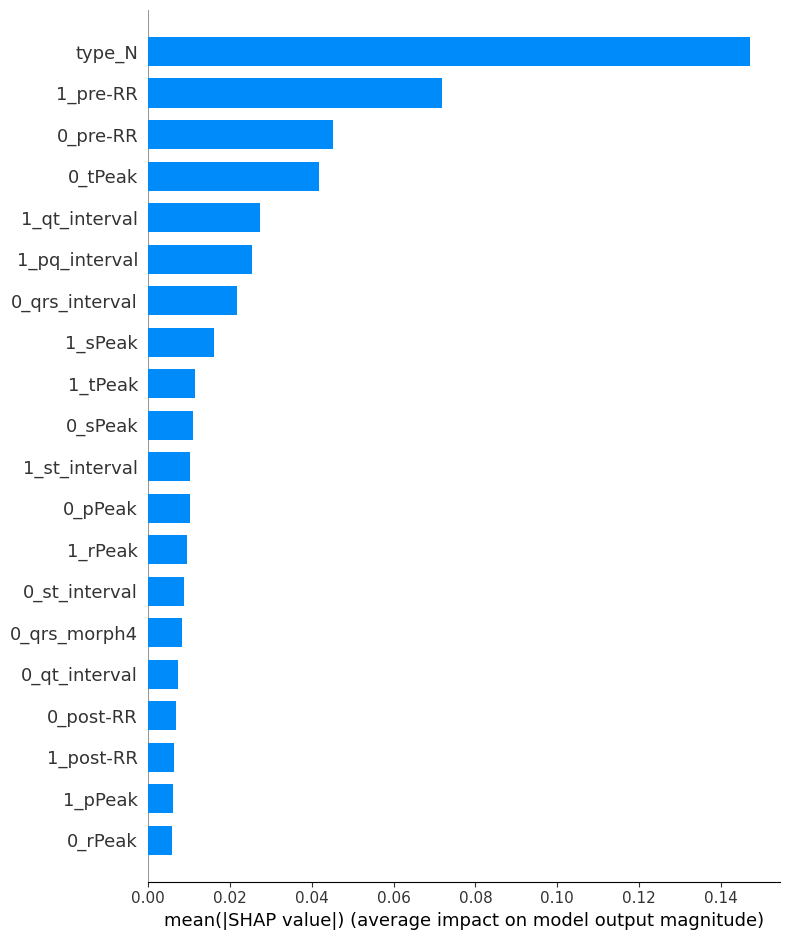

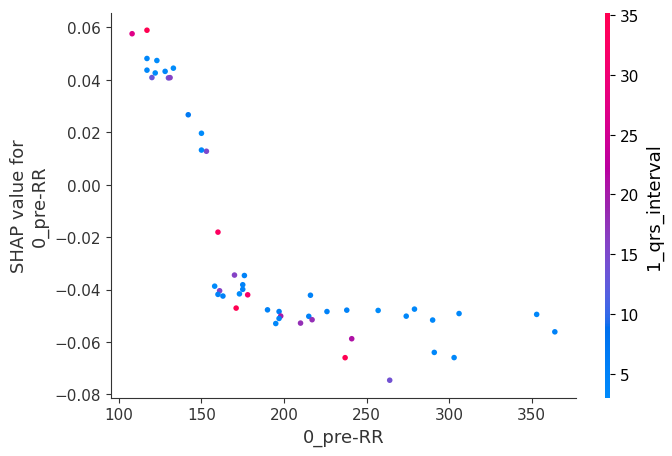

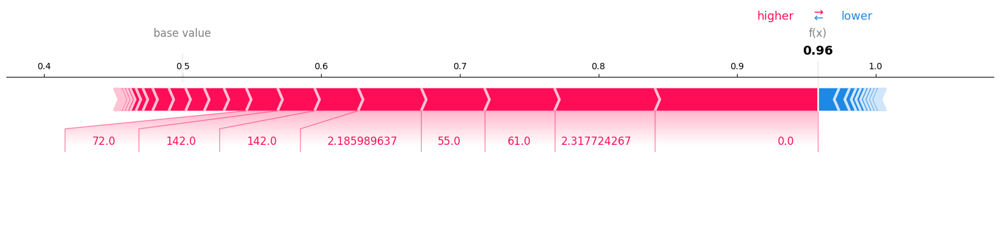

In [59]:
# ==============================
# SHAP EXPLANATION (Random Forest FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (Random Forest) ---")

import shap
import pandas as pd
import numpy as np

# -------------------------------
# 0. PREPARE DATA (IMPORTANT)
# -------------------------------
# Ensure DataFrame + correct feature names
X_test_df = pd.DataFrame(X_test, columns=X.columns).astype(float)

# 🔥 Use small sample (avoid slow / crash)
X_sample = X_test_df.sample(min(50, len(X_test_df)), random_state=42)

# -------------------------------
# 1. EXPLAINER (TREE MODEL)
# -------------------------------
explainer = shap.TreeExplainer(best_rf)

# -------------------------------
# 2. SHAP VALUES
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# Handle binary classification properly
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
elif isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    shap_values_class1 = shap_values[:, :, 1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 3. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_sample, plot_type="bar")

# -------------------------------
# 4. DETAILED SUMMARY (optional)
# -------------------------------
# shap.summary_plot(shap_values_class1, X_sample)

# -------------------------------
# 5. DEPENDENCE PLOT (FIXED)
# -------------------------------
shap.dependence_plot(
    0,                      # use index instead of column name
    shap_values_class1,
    X_sample
)

# -------------------------------
# 6. LOCAL EXPLANATION (SAFE)
# -------------------------------
base_value = explainer.expected_value

# Fix base value shape
if isinstance(base_value, (list, np.ndarray)):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_sample.iloc[0].values,   # 🔥 FIX
    matplotlib=True
)

In [60]:
# ==============================
# LIME EXPLANATION (Random Forest - FINAL)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION (Random Forest) ---")

# -------------------------------
# ✅ PREPARE DATA (match training pipeline)
# -------------------------------
# If you scaled features for training, use the SAME scaled arrays here:
X_train_df = pd.DataFrame(X_train_f, columns=X.columns).astype(float)
X_test_df  = pd.DataFrame(X_test_f,  columns=X.columns).astype(float)

X_train_np = X_train_df.values
X_test_np  = X_test_df.values

# -------------------------------
# ✅ CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],   # adjust labels if needed
    mode="classification",
    discretize_continuous=True
)

# -------------------------------
# ✅ EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_rf.predict_proba,     # IMPORTANT
    num_features=10
)

# -------------------------------
# ✅ OUTPUT (TEXT)
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_rf.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feat, w in exp.as_list():
    print(f"{feat}: {w:.4f}")

# -------------------------------
# ✅ VISUAL (if notebook)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# ✅ SAVE HTML
# -------------------------------
exp.save_to_file("/content/lime_rf_explanation.html")
print("\n📁 Saved: /content/lime_rf_explanation.html")


--- LIME EXPLANATION (Random Forest) ---

🔹 Prediction Probabilities:
[[0.92434333 0.07565667]]

🔹 LIME Explanation:
0.00 < type_N <= 1.00: -0.3408
146.00 < 1_pre-RR <= 198.00: -0.0676
record_I70 <= 0.00: 0.0550
1_sPeak > -0.47: 0.0480
type_SVEB <= 0.00: 0.0440
record_I56 <= 0.00: 0.0356
0.18 < 0_tPeak <= 0.94: 0.0342
146.00 < 0_pre-RR <= 198.00: -0.0339
record_I68 <= 0.00: 0.0324
record_I26 <= 0.00: 0.0299



📁 Saved: /content/lime_rf_explanation.html


# **Decision Tree**

In [62]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

In [63]:
# ==============================
# FAST DECISION TREE TUNING
# ==============================

# Smaller parameter space
params_dt = {
    "max_depth": [5, 10],
    "min_samples_split": [2],
    "min_samples_leaf": [1],
    "criterion": ["gini"]
}

# Faster CV
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# Fast Decision Tree
dt = DecisionTreeClassifier(
    random_state=42,
    class_weight="balanced"
)

# Randomized Search
rscv_dt = RandomizedSearchCV(
    estimator=dt,
    param_distributions=params_dt,
    n_iter=1,          # ultra fast
    scoring='f1',
    cv=cv_fast,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# Train
rscv_dt.fit(X_train_ad, y_train_ad)

# Best Model
best_dt = rscv_dt.best_estimator_

Fitting 2 folds for each of 1 candidates, totalling 2 fits


In [64]:
print("\n🌳 Decision Tree (Tuned)")

y_pred_dt = best_dt.predict(X_test_scaled)
y_prob_dt = best_dt.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_dt, y_prob_dt)

print("Best Params (DT):", rscv_dt.best_params_)


🌳 Decision Tree (Tuned)
Accuracy    : 0.9989
Precision   : 0.9913
Recall      : 0.9990
Specificity : 0.9989
F1 Score    : 0.9951
ROC-AUC     : 0.9992
MCC         : 0.9945
G-Mean      : 0.9989
Kappa       : 0.9945
Best Params (DT): {'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 10, 'criterion': 'gini'}


In [66]:
results_dt = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    # ==============================
    # SPLIT DATA
    # ==============================
    X_train_f = X.iloc[train_idx]
    X_test_f  = X.iloc[test_idx]

    y_train_f = y.iloc[train_idx]
    y_test_f  = y.iloc[test_idx]

    # ==============================
    # REMOVE SCALING
    # Decision Tree doesn't need scaling
    # ==============================

    # ==============================
    # FAST OVERSAMPLING
    # ==============================
    ros = RandomOverSampler(random_state=42)

    X_train_f, y_train_f = ros.fit_resample(
        X_train_f,
        y_train_f
    )

    # ==============================
    # TRAIN
    # ==============================
    start_time = time.time()

    best_dt.fit(X_train_f, y_train_f)

    training_time = time.time() - start_time

    # ==============================
    # PREDICT
    # ==============================
    y_pred = best_dt.predict(X_test_f)

    y_prob = best_dt.predict_proba(X_test_f)[:, 1]

    # ==============================
    # METRICS
    # ==============================
    acc = accuracy_score(y_test_f, y_pred)

    prec = precision_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    rec = recall_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    tn, fp, fn, tp = confusion_matrix(
        y_test_f,
        y_pred
    ).ravel()

    specificity = tn / (tn + fp)

    fpr = fp / (fp + tn)

    gm = np.sqrt(rec * specificity)

    auc = roc_auc_score(y_test_f, y_prob)

    mcc = matthews_corrcoef(y_test_f, y_pred)

    kappa = cohen_kappa_score(y_test_f, y_pred)

    balanced_acc = (rec + specificity) / 2

    # ==============================
    # STORE RESULTS
    # ==============================
    results_dt.append({

        "Fold": fold + 1,

        "Classifier": "Decision Tree",

        "Accuracy": acc,

        "Precision": prec,

        "Recall": rec,

        "Specificity": specificity,

        "F1": f1,

        "GM": gm,

        "FPR": fpr,

        "AUC": auc,

        "MCC": mcc,

        "Kappa": kappa,

        "Balanced Accuracy": balanced_acc,

        "Training Time (s)": training_time
    })


In [67]:
#All Model
#df_cat = pd.DataFrame(results1)
#df_lr  = pd.DataFrame(results_lr)
df_dt  = pd.DataFrame(results_dt)

final_df = pd.concat([ df_dt])

In [ ]:
#Print Comparison
print("\n===== Decision Tree MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== Decision Tree MODELS =====
 Fold    Classifier  Accuracy  Precision  Recall  Specificity       F1       GM      FPR      AUC      MCC    Kappa  Balanced Accuracy  Training Time (s)
    1 Decision Tree  0.998464   0.986680  1.0000     0.998266 0.993295 0.999133 0.001734 0.999307 0.992456 0.992428           0.999133          18.428223
    2 Decision Tree  0.998862   0.990099  1.0000     0.998716 0.995025 0.999358 0.001284 0.999441 0.994398 0.994382           0.999358           8.933264
    3 Decision Tree  0.998748   0.989120  1.0000     0.998587 0.994530 0.999293 0.001413 0.999354 0.993842 0.993823           0.999294           8.235432
    4 Decision Tree  0.999033   0.991572  1.0000     0.998908 0.995768 0.999454 0.001092 0.999665 0.995233 0.995222           0.999454           8.362354
    5 Decision Tree  0.998919   0.991076  0.9995     0.998844 0.995270 0.999172 0.001156 0.999381 0.994671 0.994660           0.999172           7.779098
    6 Decision Tree  0.998520   0.987167  


--- SHAP EXPLANATION (Decision Tree) ---


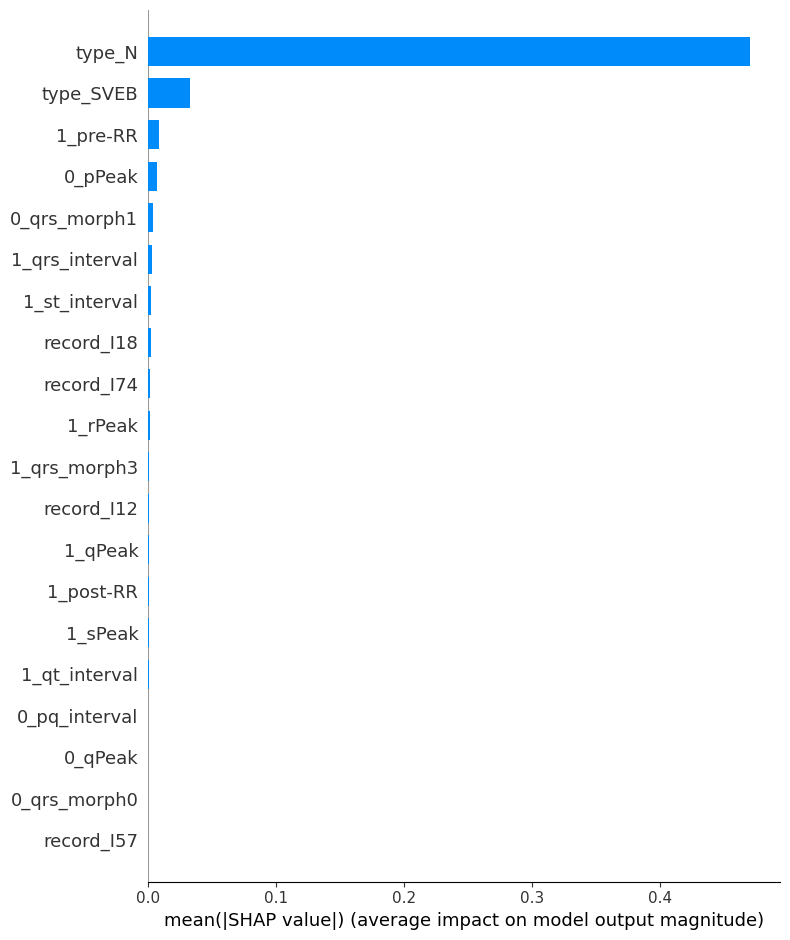

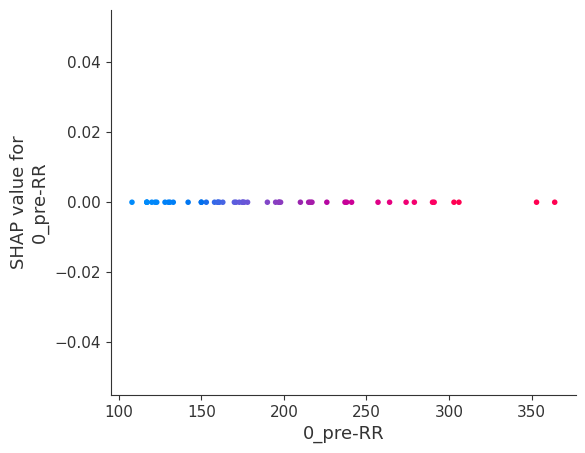

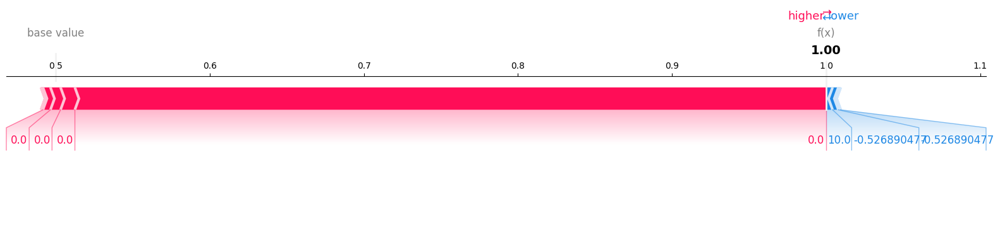

In [68]:
# ==============================
# SHAP EXPLANATION (Decision Tree FINAL)
# ==============================

print("\n--- SHAP EXPLANATION (Decision Tree) ---")

import shap
import pandas as pd
import numpy as np

# -------------------------------
# 0. PREPARE DATA
# -------------------------------
X_test_df = pd.DataFrame(X_test, columns=X.columns).astype(float)

# 🔥 Use small sample (important for speed)
X_sample = X_test_df.sample(min(50, len(X_test_df)), random_state=42)

# -------------------------------
# 1. EXPLAINER (TREE MODEL)
# -------------------------------
explainer = shap.TreeExplainer(best_dt)   # ← Decision Tree model

# -------------------------------
# 2. SHAP VALUES
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# Handle classification output
if isinstance(shap_values, list):
    shap_values_class1 = shap_values[1]
elif isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
    shap_values_class1 = shap_values[:, :, 1]
else:
    shap_values_class1 = shap_values

# -------------------------------
# 3. GLOBAL FEATURE IMPORTANCE
# -------------------------------
shap.summary_plot(shap_values_class1, X_sample, plot_type="bar")

# -------------------------------
# 4. DEPENDENCE PLOT (SAFE)
# -------------------------------
shap.dependence_plot(
    0,                     # feature index (safe)
    shap_values_class1,
    X_sample
)

# -------------------------------
# 5. LOCAL EXPLANATION
# -------------------------------
base_value = explainer.expected_value

# Fix base value
if isinstance(base_value, (list, np.ndarray)):
    base_value = base_value[1]

shap.force_plot(
    base_value,
    shap_values_class1[0],
    X_sample.iloc[0].values,
    matplotlib=True
)

# **K Nearest Neighbour **

In [71]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

In [72]:
params_knn = {

    "n_neighbors": [5],

    "weights": ["distance"],

    "metric": ["euclidean"]
}

# Faster CV
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# Fast KNN
knn = KNeighborsClassifier(
    n_jobs=-1
)

# Randomized Search
rscv_knn = RandomizedSearchCV(

    estimator=knn,

    param_distributions=params_knn,

    n_iter=1,          # ultra fast

    scoring='f1',

    cv=cv_fast,

    verbose=1,

    n_jobs=-1,

    random_state=42
)

# Train
rscv_knn.fit(X_train_ad, y_train_ad)

# Best Model
best_knn = rscv_knn.best_estimator_

Fitting 2 folds for each of 1 candidates, totalling 2 fits


In [73]:
print("\n KNN (Tuned)")

y_pred_knn = best_knn.predict(X_test_scaled)
y_prob_knn = best_knn.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_knn, y_prob_knn)

print("Best Params (KNN):", rscv_knn.best_params_)


 KNN (Tuned)
Accuracy    : 0.9990
Precision   : 0.9933
Recall      : 0.9982
Specificity : 0.9991
F1 Score    : 0.9958
ROC-AUC     : 0.9989
MCC         : 0.9952
G-Mean      : 0.9987
Kappa       : 0.9952
Best Params (KNN): {'weights': 'distance', 'n_neighbors': 5, 'metric': 'euclidean'}


In [75]:
results_knn = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    # ==============================
    # SPLIT DATA
    # ==============================
    X_train_f = X.iloc[train_idx]

    X_test_f = X.iloc[test_idx]

    y_train_f = y.iloc[train_idx]

    y_test_f = y.iloc[test_idx]

    # ==============================
    # SCALING (IMPORTANT FOR KNN)
    # ==============================
    scaler = StandardScaler()

    X_train_f = scaler.fit_transform(X_train_f)

    X_test_f = scaler.transform(X_test_f)

    # ==============================
    # FAST OVERSAMPLING
    # ==============================
    ros = RandomOverSampler(random_state=42)

    X_train_f, y_train_f = ros.fit_resample(
        X_train_f,
        y_train_f
    )

    # ==============================
    # TRAIN
    # ==============================
    start_time = time.time()

    best_knn.fit(X_train_f, y_train_f)

    training_time = time.time() - start_time

    # ==============================
    # PREDICT
    # ==============================
    y_pred = best_knn.predict(X_test_f)

    # ==============================
    # FAST METRICS
    # ==============================
    acc = accuracy_score(y_test_f, y_pred)

    prec = precision_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    rec = recall_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    tn, fp, fn, tp = confusion_matrix(
        y_test_f,
        y_pred
    ).ravel()

    specificity = tn / (tn + fp)

    balanced_acc = (rec + specificity) / 2

    # ==============================
    # STORE RESULTS
    # ==============================
    results_knn.append({

        "Fold": fold + 1,

        "Classifier": "KNN",

        "Accuracy": acc,

        "Precision": prec,

        "Recall": rec,

        "Specificity": specificity,

        "F1": f1,

        "Balanced Accuracy": balanced_acc,

        "Training Time (s)": training_time
    })

In [76]:
df_knn = pd.DataFrame(results_knn)

final_df = pd.concat([df_knn])

In [77]:
print("\n===== KNN MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== KNN MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1  Balanced Accuracy  Training Time (s)
    1        KNN  0.998577   0.989104  0.9985     0.998587 0.993780           0.998544           0.181243
    2        KNN  0.998862   0.992537  0.9975     0.999037 0.995012           0.998268           0.054823
    3        KNN  0.998919   0.992052  0.9985     0.998973 0.995265           0.998736           0.039729
    4        KNN  0.998976   0.993035  0.9980     0.999101 0.995511           0.998551           0.053974
    5        KNN  0.999317   0.996503  0.9975     0.999551 0.997001           0.998525           0.039726
    6        KNN  0.998919   0.993031  0.9975     0.999101 0.995261           0.998301           0.052975
    7        KNN  0.999090   0.994516  0.9975     0.999294 0.996006           0.998397           0.039783
    8        KNN  0.998634   0.990566  0.9975     0.998780 0.994021           0.998140           0.052128
    9        KNN  0.99


--- SHAP EXPLANATION (KNN FINAL - FIXED) ---


  0%|          | 0/2 [00:00<?, ?it/s]

SHAP shape: (2, 109)
X_sample shape: (2, 109)


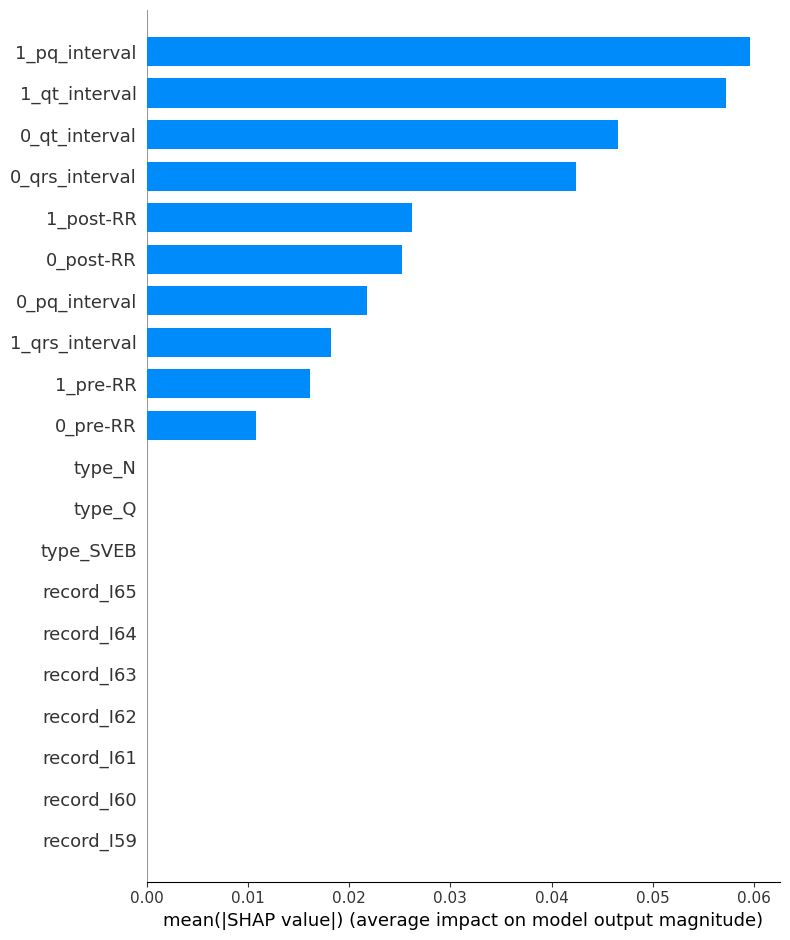

Single SHAP: (109,)
Single sample: (109,)


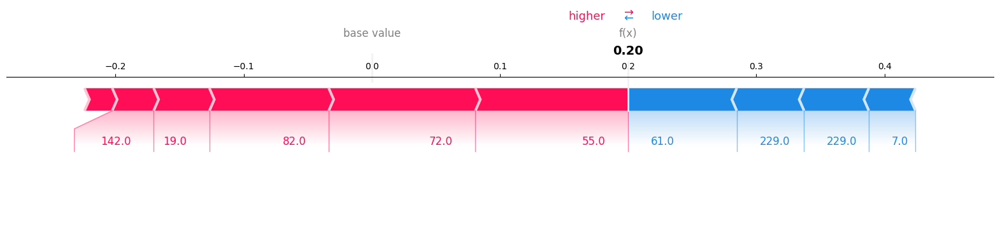

In [79]:
print("\n--- SHAP EXPLANATION (KNN FINAL - FIXED) ---")

import shap
import numpy as np
import pandas as pd

# -------------------------------
# STEP 1: Prepare Data
# -------------------------------
feature_names = X.columns.tolist()

X_train_df = pd.DataFrame(X_train, columns=feature_names).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=feature_names).astype(float)

# -------------------------------
# STEP 2: Speed Control
# -------------------------------
X_background = X_train_df.sample(5, random_state=42)
X_sample     = X_test_df.sample(2, random_state=42)

# -------------------------------
# STEP 3: SHAP Explainer
# -------------------------------
explainer = shap.KernelExplainer(
    best_knn.predict_proba,
    X_background
)

# -------------------------------
# STEP 4: SHAP Values
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# -------------------------------
# STEP 5: FIX SHAPE (IMPORTANT)
# -------------------------------
if isinstance(shap_values, list):
    shap_vals = shap_values[1]               # class 1
    base_val  = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_vals = shap_values[:, :, 1]
        base_val  = explainer.expected_value[1]
    else:
        shap_vals = shap_values
        base_val  = explainer.expected_value

# Ensure scalar base value
if isinstance(base_val, (list, np.ndarray)):
    base_val = float(np.array(base_val).flatten()[0])

# Debug check (optional)
print("SHAP shape:", shap_vals.shape)
print("X_sample shape:", X_sample.shape)

# -------------------------------
# STEP 6: GLOBAL IMPORTANCE
# -------------------------------
shap.summary_plot(shap_vals, X_sample, plot_type="bar")

# -------------------------------
# STEP 7: FORCE PLOT (SAFE)
# -------------------------------
sample = X_sample.iloc[0]
shap_val = shap_vals[0]

# Ensure correct shape
shap_val = np.array(shap_val).reshape(-1)
sample_vals = sample.values.reshape(-1)

print("Single SHAP:", shap_val.shape)
print("Single sample:", sample_vals.shape)

shap.force_plot(
    base_val,
    shap_val,
    sample_vals,
    matplotlib=True
)

In [80]:
# ==============================
# LIME EXPLANATION (KNN FINAL)
# ==============================

from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import pandas as pd

print("\n--- LIME EXPLANATION (KNN) ---")

# -------------------------------
# 0. PREPARE DATA (match training pipeline)
# -------------------------------
# If you scaled before training KNN, use the SAME scaled arrays here
X_train_df = pd.DataFrame(X_train, columns=X.columns).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=X.columns).astype(float)

# Ensure no NaN
X_train_df = X_train_df.fillna(0)
X_test_df  = X_test_df.fillna(0)

X_train_np = X_train_df.values
X_test_np  = X_test_df.values

# -------------------------------
# 1. CREATE EXPLAINER
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=X.columns.tolist(),
    class_names=["Class 0", "Class 1"],  # adjust if needed
    mode="classification",
    discretize_continuous=True
)

# -------------------------------
# 2. EXPLAIN ONE INSTANCE
# -------------------------------
i = 0  # choose any test index

exp = explainer.explain_instance(
    X_test_np[i],
    best_knn.predict_proba,     # IMPORTANT
    num_features=10
)

# -------------------------------
# 3. OUTPUT (TEXT)
# -------------------------------
print("\n🔹 Prediction Probabilities:")
print(best_knn.predict_proba(X_test_np[i].reshape(1, -1)))

print("\n🔹 LIME Explanation:")
for feat, w in exp.as_list():
    print(f"{feat}: {w:.4f}")

# -------------------------------
# 4. VISUAL (NOTEBOOK)
# -------------------------------
try:
    exp.show_in_notebook(show_table=True)
except:
    print("Notebook visualization not supported here.")

# -------------------------------
# 5. SAVE HTML
# -------------------------------
exp.save_to_file("/content/lime_knn_explanation.html")
print("\n📁 Saved: /content/lime_knn_explanation.html")


--- LIME EXPLANATION (KNN) ---

🔹 Prediction Probabilities:
[[1. 0.]]

🔹 LIME Explanation:
record_I61 <= 0.00: -0.0169
record_I30 <= 0.00: -0.0148
record_I19 <= 0.00: -0.0144
record_I60 <= 0.00: -0.0136
record_I20 <= 0.00: -0.0122
record_I67 <= 0.00: -0.0110
record_I74 <= 0.00: -0.0105
record_I04 <= 0.00: -0.0060
record_I22 > 0.00: 0.0040
type_Q <= 0.00: 0.0001



📁 Saved: /content/lime_knn_explanation.html


# ** Multi Layer Perceptron**

In [81]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold

In [82]:
params_mlp = {

    "hidden_layer_sizes": [(50,)],

    "alpha": [0.001],

    "activation": ["relu"]
}

# Fast MLP
mlp = MLPClassifier(

    hidden_layer_sizes=(50,),

    activation='relu',

    solver='adam',

    alpha=0.001,

    batch_size=256,          # faster training

    learning_rate='adaptive',

    max_iter=80,             # lower

    early_stopping=True,     # huge speed boost

    validation_fraction=0.1,

    n_iter_no_change=3,      # faster stop

    random_state=42
)

# Faster CV
cv_fast = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

# Random Search
rscv_mlp = RandomizedSearchCV(

    estimator=mlp,

    param_distributions=params_mlp,

    n_iter=1,                # ultra fast

    scoring='f1',

    cv=cv_fast,

    n_jobs=-1,

    verbose=1,

    random_state=42
)

# Train
rscv_mlp.fit(X_train_ad, y_train_ad)

# Best Model
best_mlp = rscv_mlp.best_estimator_

Fitting 2 folds for each of 1 candidates, totalling 2 fits


In [83]:
print("\n MLP (Tuned)")

y_pred_mlp = best_mlp.predict(X_test_scaled)
y_prob_mlp = best_mlp.predict_proba(X_test_scaled)[:,1]

compute_metrics(y_test, y_pred_mlp, y_prob_mlp)

print("Best Params (MLP):", rscv_mlp.best_params_)


 MLP (Tuned)
Accuracy    : 0.9989
Precision   : 0.9906
Recall      : 0.9995
Specificity : 0.9988
F1 Score    : 0.9950
ROC-AUC     : 0.9999
MCC         : 0.9944
G-Mean      : 0.9991
Kappa       : 0.9944
Best Params (MLP): {'hidden_layer_sizes': (50,), 'alpha': 0.001, 'activation': 'relu'}


In [84]:
results_mlp = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):

    # ==============================
    # SPLIT DATA
    # ==============================
    X_train_f = X.iloc[train_idx]

    X_test_f = X.iloc[test_idx]

    y_train_f = y.iloc[train_idx]

    y_test_f = y.iloc[test_idx]

    # ==============================
    # SCALING (IMPORTANT FOR MLP)
    # ==============================
    scaler = StandardScaler()

    X_train_f = scaler.fit_transform(X_train_f)

    X_test_f = scaler.transform(X_test_f)

    # ==============================
    # FAST OVERSAMPLING
    # ==============================
    ros = RandomOverSampler(random_state=42)

    X_train_f, y_train_f = ros.fit_resample(
        X_train_f,
        y_train_f
    )

    # ==============================
    # TRAIN
    # ==============================
    start_time = time.time()

    best_mlp.fit(X_train_f, y_train_f)

    training_time = time.time() - start_time

    # ==============================
    # PREDICT
    # ==============================
    y_pred = best_mlp.predict(X_test_f)

    # ==============================
    # FAST METRICS
    # ==============================
    acc = accuracy_score(y_test_f, y_pred)

    prec = precision_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    rec = recall_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_test_f,
        y_pred,
        zero_division=0
    )

    tn, fp, fn, tp = confusion_matrix(
        y_test_f,
        y_pred
    ).ravel()

    specificity = tn / (tn + fp)

    balanced_acc = (rec + specificity) / 2

    # ==============================
    # STORE RESULTS
    # ==============================
    results_mlp.append({

        "Fold": fold + 1,

        "Classifier": "MLP",

        "Accuracy": acc,

        "Precision": prec,

        "Recall": rec,

        "Specificity": specificity,

        "F1": f1,

        "Balanced Accuracy": balanced_acc,

        "Training Time (s)": training_time
    })

In [85]:
df_mlp = pd.DataFrame(results_mlp)

final_df = pd.concat([ df_mlp])

In [86]:
print("\n===== MLP MODELS =====")
print(final_df.to_string(index=False))

print("\n===== AVERAGE COMPARISON =====")
print(final_df.groupby("Classifier").mean(numeric_only=True))


===== MLP MODELS =====
 Fold Classifier  Accuracy  Precision  Recall  Specificity       F1  Balanced Accuracy  Training Time (s)
    1        MLP  0.998862   0.990099  1.0000     0.998716 0.995025           0.999358          13.244829
    2        MLP  0.999033   0.992548  0.9990     0.999037 0.995764           0.999018           9.669009
    3        MLP  0.999374   0.994530  1.0000     0.999294 0.997258           0.999647           8.248884
    4        MLP  0.999203   0.994030  0.9990     0.999229 0.996509           0.999115          10.372149
    5        MLP  0.999374   0.995022  0.9995     0.999358 0.997256           0.999429           9.417689
    6        MLP  0.998691   0.989114  0.9995     0.998587 0.994280           0.999044           7.588978
    7        MLP  0.999146   0.992556  1.0000     0.999037 0.996264           0.999518           7.392258
    8        MLP  0.999033   0.992060  0.9995     0.998973 0.995766           0.999236           8.679178
    9        MLP  0.99


--- SHAP EXPLANATION (MLP FINAL - ERROR FREE) ---


  0%|          | 0/5 [00:00<?, ?it/s]

SHAP shape: (5, 109)
X_sample shape: (5, 109)


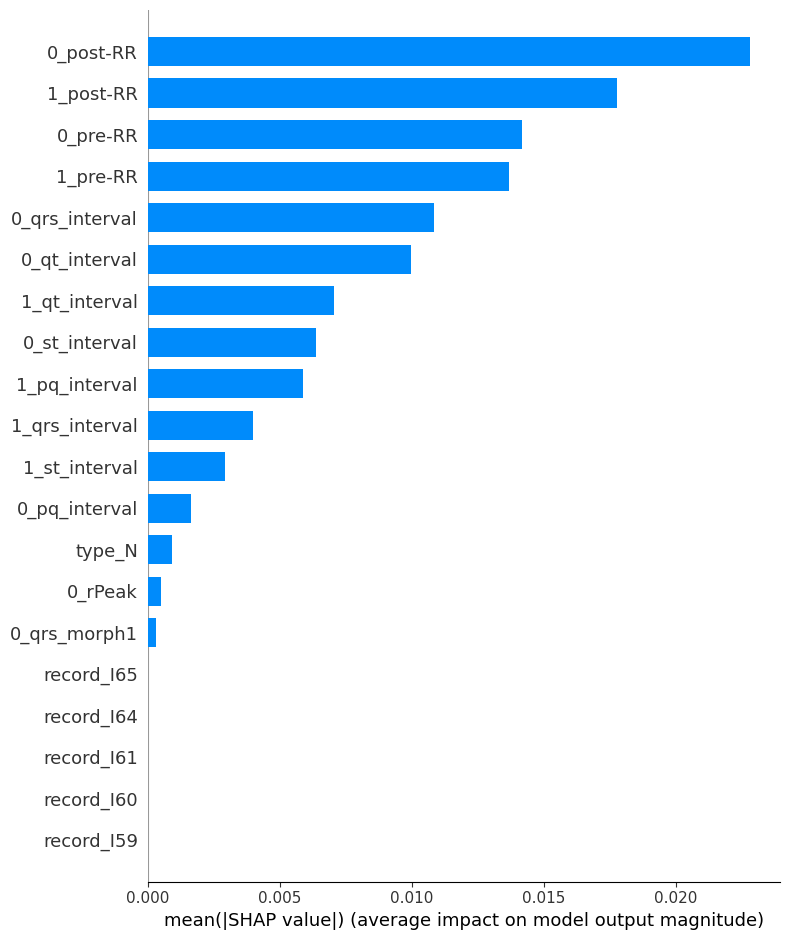

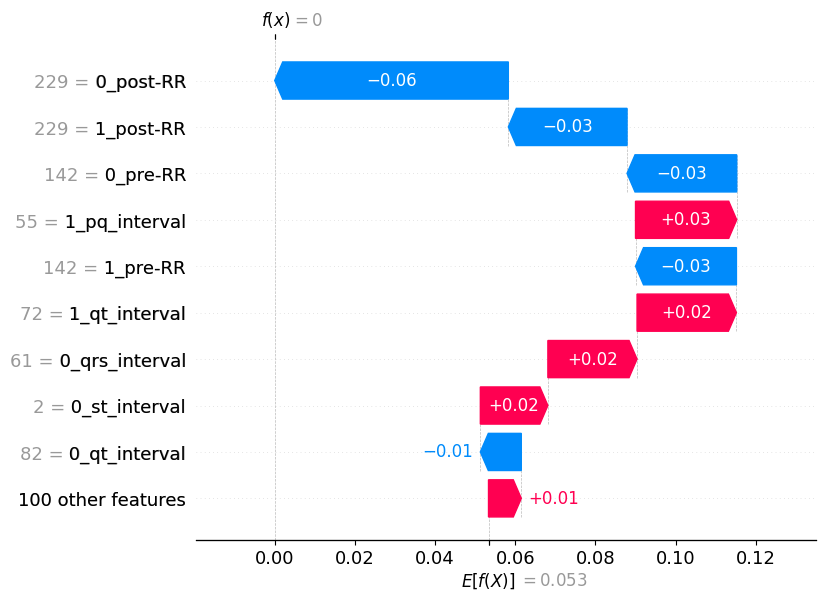

SHAP: (109,)
Features: (109,)


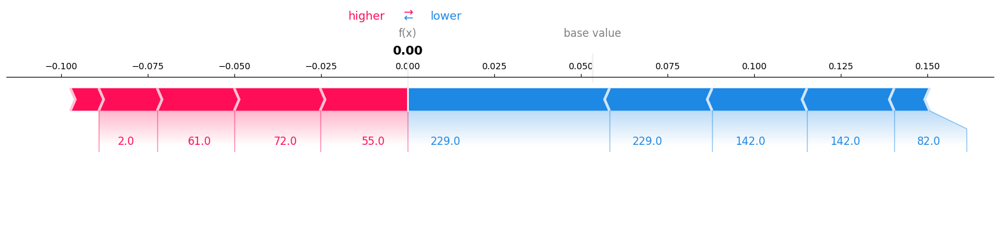

In [87]:
print("\n--- SHAP EXPLANATION (MLP FINAL - ERROR FREE) ---")

import shap
import numpy as np
import pandas as pd

# -------------------------------
# STEP 1: Prepare Data
# -------------------------------
feature_names = X.columns.tolist()

X_train_df = pd.DataFrame(X_train, columns=feature_names).astype(float)
X_test_df  = pd.DataFrame(X_test,  columns=feature_names).astype(float)

# -------------------------------
# STEP 2: Speed Control
# -------------------------------
X_background = X_train_df.sample(10, random_state=42)
X_sample     = X_test_df.sample(5, random_state=42)

# -------------------------------
# STEP 3: SHAP Explainer
# -------------------------------
explainer = shap.KernelExplainer(
    best_mlp.predict_proba,
    X_background
)

# -------------------------------
# STEP 4: SHAP Values
# -------------------------------
shap_values = explainer.shap_values(X_sample)

# -------------------------------
# STEP 5: FIX SHAPE (CRITICAL)
# -------------------------------
if isinstance(shap_values, list):
    shap_vals = shap_values[1]   # binary → class 1
    base_val  = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_vals = shap_values[:, :, 1]   # pick class 1
        base_val  = explainer.expected_value[1]
    else:
        shap_vals = shap_values
        base_val  = explainer.expected_value

# Ensure scalar base value
if isinstance(base_val, (list, np.ndarray)):
    base_val = float(np.array(base_val).flatten()[0])

# Debug (optional)
print("SHAP shape:", shap_vals.shape)
print("X_sample shape:", X_sample.shape)

# -------------------------------
# STEP 6: GLOBAL IMPORTANCE
# -------------------------------
shap.summary_plot(shap_vals, X_sample, plot_type="bar")

# -------------------------------
# STEP 7: LOCAL EXPLANATION
# -------------------------------
exp = shap.Explanation(
    values=shap_vals[0],
    base_values=base_val,
    data=X_sample.iloc[0],
    feature_names=feature_names
)

# Stable plot (no errors)
shap.plots.waterfall(exp)

# Optional interactive plot
# shap.plots.force(exp)

# -------------------------------
# FORCE PLOT (FINAL - CORRECT)
# -------------------------------

# Select single sample
sample = X_sample.iloc[0]

# Get correct SHAP values (class 1)
if isinstance(shap_values, list):
    shap_val = shap_values[1][0]   # class 1
    base_val = explainer.expected_value[1]
else:
    if len(shap_values.shape) == 3:
        shap_val = shap_values[0, :, 1]
        base_val = explainer.expected_value[1]
    else:
        shap_val = shap_values[0]
        base_val = explainer.expected_value

# Ensure correct shape
shap_val = np.array(shap_val).reshape(-1)
sample_vals = sample.values.reshape(-1)

# Final check
print("SHAP:", shap_val.shape)
print("Features:", sample_vals.shape)

# Plot
shap.force_plot(
    float(base_val),
    shap_val,
    sample_vals,
    matplotlib=True
)

In [88]:
print("\n--- LIME EXPLANATION (MLP) ---")

from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# -------------------------------
# STEP 1: Prepare data
# -------------------------------
feature_names = X.columns.tolist()
class_names = ['Class 0', 'Class 1']  # change if needed

# Convert to numpy (LIME needs numpy)
X_train_np = np.array(X_train)
X_test_np  = np.array(X_test)

# -------------------------------
# STEP 2: Create Explainer
# -------------------------------
explainer = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

# -------------------------------
# STEP 3: Select sample
# -------------------------------
i = 0   # you can change index
sample = X_test_np[i]

# -------------------------------
# STEP 4: Explain prediction
# -------------------------------
exp = explainer.explain_instance(
    data_row=sample,
    predict_fn=best_mlp.predict_proba,
    num_features=10
)

# -------------------------------
# STEP 5: Show explanation
# -------------------------------
exp.show_in_notebook(show_table=True)

# -------------------------------
# STEP 6: Print explanation
# -------------------------------
print("\nFeature Contributions:")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:.4f}")


--- LIME EXPLANATION (MLP) ---



Feature Contributions:
record_I46 <= 0.00: -0.0119
record_I40 <= 0.00: -0.0110
30.00 < 0_qt_interval <= 44.00: 0.0010
0.64 < 0_qrs_morph3 <= 1.14: 0.0009
-0.54 < 1_qrs_morph2 <= -0.34: 0.0008
0_sPeak <= -0.91: 0.0008
0_qrs_interval > 22.00: 0.0008
-0.32 < 1_qrs_morph0 <= -0.12: 0.0008
record_I37 <= 0.00: 0.0005
record_I33 <= 0.00: 0.0005


# **CREATE FINAL RESULTS FILE**

In [128]:
# ==============================
# CREATE FINAL RESULTS FILE
# ==============================

import pandas as pd

# ==============================
# CONVERT LIST TO DATAFRAME
# ==============================
results1 = pd.DataFrame(results1)

# ==============================
# COMBINE ALL RESULT DATAFRAMES
# ==============================
df_all = pd.concat([

    pd.DataFrame(results_lr),

    pd.DataFrame(results_dt),

    pd.DataFrame(results_rf),

    pd.DataFrame(results_gbm),

    pd.DataFrame(results_xgb),

    pd.DataFrame(results_lgb),

    pd.DataFrame(results1),      # CatBoost

    pd.DataFrame(results_knn),

    pd.DataFrame(results_mlp)

], ignore_index=True)

# ==============================
# SAVE CSV FILE
# ==============================
file_path = "/content/final_results.csv"

df_all.to_csv(file_path, index=False)

# ==============================
# OUTPUT
# ==============================
print("✅ Results file created successfully!")

print("\n📁 File saved at:")
print(file_path)

print("\n==============================")
print("FIRST 5 ROWS")
print("==============================")

print(df_all.head())

print("\n==============================")
print("COLUMNS")
print("==============================")

print(df_all.columns)

print("\n==============================")
print("DATA SHAPE")
print("==============================")

print(df_all.shape)

✅ Results file created successfully!

📁 File saved at:
/content/final_results.csv

FIRST 5 ROWS
   Fold           Classifier  Accuracy  Precision  Recall  Specificity  \
0     1  Logistic Regression  0.998520   0.987167     1.0     0.998330   
1     2  Logistic Regression  0.998976   0.991080     1.0     0.998844   
2     3  Logistic Regression  0.998805   0.989609     1.0     0.998652   
3     4  Logistic Regression  0.998976   0.991080     1.0     0.998844   
4     5  Logistic Regression  0.999090   0.992063     1.0     0.998973   

         F1        GM       FPR       AUC       MCC     Kappa  \
0  0.993542  0.999165  0.001670  0.999926  0.992733  0.992707   
1  0.995520  0.999422  0.001156  0.999905  0.994955  0.994942   
2  0.994777  0.999326  0.001348  0.999966  0.994120  0.994103   
3  0.995520  0.999422  0.001156  0.999874  0.994955  0.994942   
4  0.996016  0.999486  0.001027  0.999960  0.995512  0.995502   

   Balanced Accuracy  Training Time (s)  
0           0.999165      

# ** wilcoxon**

In [131]:
import pandas as pd
from scipy.stats import wilcoxon
from itertools import combinations
from statsmodels.stats.multitest import multipletests

# ==============================
# LOAD FILE
# ==============================
file_path = "/content/final_results.csv"
df = pd.read_csv(file_path)

# -------------------------------
# CHECK REQUIRED COLUMNS
# -------------------------------
required_cols = ["Fold", "Classifier"]

for col in required_cols:
    if col not in df.columns:
        raise ValueError(f"❌ Missing column: {col}")

# -------------------------------
# METRICS
# -------------------------------
metrics = [
    "Accuracy", "AUC", "F1", "FPR", "GM",
    "Kappa", "MCC", "Precision", "Recall", "Specificity"
]

lower_is_better = ["FPR"]

all_results = []

# ==============================
# LOOP METRICS
# ==============================
for metric in metrics:

    if metric not in df.columns:
        print(f"⚠️ Skipping: {metric}")
        continue

    print(f"\nProcessing: {metric}")

    pivot = df.pivot(index="Fold", columns="Classifier", values=metric)

    models = pivot.columns

    # -------------------------------
    # ✅ UNIQUE PAIRWISE (NO DUPLICATE)
    # -------------------------------
    for m1, m2 in combinations(models, 2):

        scores1 = pivot[m1].dropna()
        scores2 = pivot[m2].dropna()

        # Align folds
        common_idx = scores1.index.intersection(scores2.index)
        scores1 = scores1.loc[common_idx]
        scores2 = scores2.loc[common_idx]

        if len(scores1) < 5:
            continue

        # Wilcoxon test
        stat, p = wilcoxon(scores1, scores2)

        mean1 = scores1.mean()
        mean2 = scores2.mean()

        # Determine better model
        if metric in lower_is_better:
            better = m1 if mean1 < mean2 else m2
        else:
            better = m1 if mean1 > mean2 else m2

        all_results.append({
            "Metric": metric,
            "Model 1": m1,
            "Model 2": m2,
            "Mean 1": round(mean1, 4),
            "Mean 2": round(mean2, 4),
            "Better Model": better,
            "Statistic": round(stat, 4),
            "p-value": p
        })

# ==============================
# CREATE DATAFRAME
# ==============================
results_df = pd.DataFrame(all_results)

# -------------------------------
# HOLM CORRECTION
# -------------------------------
reject, p_adj, _, _ = multipletests(results_df["p-value"], method='holm')

results_df["Adjusted p-value"] = p_adj
results_df["Significant"] = ["Yes" if r else "No" for r in reject]

# -------------------------------
# ROUND VALUES
# -------------------------------
results_df["p-value"] = results_df["p-value"].round(5)
results_df["Adjusted p-value"] = results_df["Adjusted p-value"].round(5)

# -------------------------------
# SORT RESULTS
# -------------------------------
results_df = results_df.sort_values(by=["Metric", "Adjusted p-value"])

# ==============================
# SAVE OUTPUT
# ==============================
output_file = "/content/wilcoxon_final_output.xlsx"
results_df.to_excel(output_file, index=False)

print("\n✅ FINAL RESULT SAVED:", output_file)

# 🔥 PRINT OUTPUT
print("\n===== FINAL RESULTS =====")
print(results_df.to_string(index=False))


Processing: Accuracy

Processing: AUC

Processing: F1

Processing: FPR

Processing: GM

Processing: Kappa

Processing: MCC

Processing: Precision

Processing: Recall

Processing: Specificity

✅ FINAL RESULT SAVED: /content/wilcoxon_final_output.xlsx

===== FINAL RESULTS =====
     Metric              Model 1              Model 2  Mean 1  Mean 2         Better Model  Statistic  p-value  Adjusted p-value Significant
        AUC             CatBoost        Decision Tree  0.9999  0.9990             CatBoost        0.0  0.00195           0.49805          No
        AUC             CatBoost             LightGBM  0.9999  1.0000             LightGBM        0.0  0.00195           0.49805          No
        AUC        Decision Tree             LightGBM  0.9990  1.0000             LightGBM        0.0  0.00195           0.49805          No
        AUC        Decision Tree  Logistic Regression  0.9990  0.9999  Logistic Regression        0.0  0.00195           0.49805          No
        AUC      

# **Topcis**

In [133]:
import pandas as pd

# ==============================
# LOAD DATA
# ==============================
file_path = "/content/final_results.csv"
df = pd.read_csv(file_path)

# -------------------------------
# METRICS
# -------------------------------
metrics = [
    "Accuracy", "Precision", "Recall", "Specificity",
    "F1", "GM", "FPR", "AUC", "MCC", "Kappa", "Balanced Accuracy"
]

lower_is_better = ["FPR"]

# -------------------------------
# MEAN PERFORMANCE PER MODEL
# -------------------------------
df_mean = df.groupby("Classifier")[metrics].mean().reset_index()

# -------------------------------
# LONG FORMAT
# -------------------------------
df_long = df_mean.melt(
    id_vars="Classifier",
    var_name="Metric",
    value_name="Score"
)

# Rename column for your format
df_long.rename(columns={"Classifier": "Model"}, inplace=True)

# -------------------------------
# RANKING (FIXED)
# -------------------------------
df_long["Rank"] = df_long.groupby("Metric")["Score"].rank(
    method="average",
    ascending=False
)

# FIX: FPR (lower is better)
mask = df_long["Metric"] == "FPR"
df_long.loc[mask, "Rank"] = (
    df_long[mask]
    .groupby("Metric")["Score"]
    .rank(method="average", ascending=True)
)

# -------------------------------
# SORT OUTPUT
# -------------------------------
df_long = df_long.sort_values(by=["Metric", "Rank"])

# -------------------------------
# SAVE FILE
# -------------------------------
output_file = "/content/final_metric_ranking.xlsx"
df_long.to_excel(output_file, index=False)

# -------------------------------
# PRINT OUTPUT
# -------------------------------
print("\n✅ FINAL RESULT:\n")
print(df_long.to_string(index=False))

print("\n📁 Saved file:", output_file)


✅ FINAL RESULT:

               Model            Metric    Score  Rank
            LightGBM               AUC 0.999982   1.0
 Logistic Regression               AUC 0.999922   2.0
             XGBoost               AUC 0.999920   3.0
            CatBoost               AUC 0.999914   4.0
       Random Forest               AUC 0.999867   5.0
       Decision Tree               AUC 0.998991   6.0
HistGradientBoosting               AUC      NaN   NaN
                 KNN               AUC      NaN   NaN
                 MLP               AUC      NaN   NaN
            LightGBM          Accuracy 0.999243   1.0
                 MLP          Accuracy 0.999112   2.0
       Decision Tree          Accuracy 0.999072   3.0
             XGBoost          Accuracy 0.998987   4.0
                 KNN          Accuracy 0.998907   5.0
 Logistic Regression          Accuracy 0.998868   6.0
            CatBoost          Accuracy 0.998805   7.0
HistGradientBoosting          Accuracy 0.998742   8.0
       Ran

In [142]:
import pandas as pd
import numpy as np

from sklearn.model_selection import (
    StratifiedKFold,
    cross_val_score
)

from sklearn.preprocessing import LabelEncoder

from sklearn.impute import SimpleImputer

from sklearn.ensemble import RandomForestClassifier

from sklearn.tree import DecisionTreeClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.linear_model import LogisticRegression

from scipy.stats import friedmanchisquare

# =========================================================
# LOAD DATASET
# =========================================================

df = pd.read_csv(
    "/content/INCART 2-lead Arrhythmia Database.csv"
)

print("Dataset Shape :", df.shape)

# =========================================================
# TARGET COLUMN
# =========================================================

target_col = "type"

print("\nTarget Column :", target_col)

# =========================================================
# FEATURES & TARGET
# =========================================================

X = df.drop(target_col, axis=1)

y = df[target_col]

# =========================================================
# ENCODE TARGET LABEL
# =========================================================

label_encoder = LabelEncoder()

y = label_encoder.fit_transform(y)

# =========================================================
# CONVERT CATEGORICAL FEATURES
# =========================================================

for col in X.columns:

    if X[col].dtype == 'object':

        le = LabelEncoder()

        X[col] = le.fit_transform(
            X[col].astype(str)
        )

# =========================================================
# HANDLE MISSING VALUES
# =========================================================

imputer = SimpleImputer(strategy='mean')

X = imputer.fit_transform(X)

# =========================================================
# DEFINE MODELS
# =========================================================

models = {

    "Random Forest": RandomForestClassifier(),

    "Decision Tree": DecisionTreeClassifier(),

    "KNN": KNeighborsClassifier(),

    "Logistic Regression": LogisticRegression(
        max_iter=1000
    )
}

# =========================================================
# CROSS VALIDATION
# =========================================================

kfold = StratifiedKFold(

    n_splits=5,

    shuffle=True,

    random_state=42
)

results = {}

print("\n========== MODEL ACCURACY ==========\n")

for name, model in models.items():

    scores = cross_val_score(

        model,

        X,

        y,

        cv=kfold,

        scoring='accuracy',

        n_jobs=-1
    )

    results[name] = scores

    print(name)

    print("Accuracy Scores :", scores)

    print("Average Accuracy :", np.mean(scores))

    print("-----------------------------------")

# =========================================================
# FRIEDMAN TEST
# =========================================================

statistic, p_value = friedmanchisquare(

    results["Random Forest"],

    results["Decision Tree"],

    results["KNN"],

    results["Logistic Regression"]
)

# =========================================================
# FINAL RESULT
# =========================================================

print("\n===================================")

print("         FRIEDMAN TEST")

print("===================================\n")

print("Friedman Statistic :", statistic)

print("P-value            :", p_value)

alpha = 0.05

print("\n========== INTERPRETATION ==========\n")

if p_value < alpha:

    print("Reject Null Hypothesis (H0)")

    print("There is a significant difference")

    print("between the machine learning models.")

else:

    print("Fail to Reject Null Hypothesis (H0)")

    print("No significant difference")

    print("between the machine learning models.")

Dataset Shape : (175729, 34)

Target Column : type

========== MODEL ACCURACY ==========

Random Forest
Accuracy Scores : [0.99621579 0.99664258 0.99607352 0.99681329 0.99698392]
Average Accuracy : 0.9965458202010116
-----------------------------------
Decision Tree
Accuracy Scores : [0.99234621 0.99314289 0.99251693 0.9932567  0.99248826]
Average Accuracy : 0.9927501991023895
-----------------------------------
KNN
Accuracy Scores : [0.99123656 0.99135037 0.99032607 0.99095203 0.99183383]
Average Accuracy : 0.9911397702943793
-----------------------------------
Logistic Regression
Accuracy Scores : [0.98457861 0.98469243 0.98531839 0.98258692 0.98540333]
Average Accuracy : 0.9845159358295629
-----------------------------------

         FRIEDMAN TEST

Friedman Statistic : 15.0
P-value            : 0.0018166489665723214

========== INTERPRETATION ==========

Reject Null Hypothesis (H0)
There is a significant difference
between the machine learning models.


In [143]:
# =========================================================
# STORE MODEL RESULTS
# =========================================================

results_table = []

for name, scores in results.items():

    results_table.append({

        "Model": name,

        "Fold 1": scores[0],

        "Fold 2": scores[1],

        "Fold 3": scores[2],

        "Fold 4": scores[3],

        "Fold 5": scores[4],

        "Average Accuracy": np.mean(scores)
    })

# Convert to DataFrame
results_df = pd.DataFrame(results_table)

# =========================================================
# STORE FRIEDMAN TEST RESULT
# =========================================================

friedman_df = pd.DataFrame({

    "Friedman Statistic": [statistic],

    "P-value": [p_value],

    "Decision": [

        "Reject H0"
        if p_value < 0.05
        else "Fail to Reject H0"
    ]
})

# =========================================================
# SAVE CSV FILES
# =========================================================

results_df.to_csv(
    "/content/model_accuracy_results.csv",
    index=False
)

friedman_df.to_csv(
    "/content/friedman_test_result.csv",
    index=False
)

# =========================================================
# DISPLAY RESULTS
# =========================================================

print("\n========== MODEL RESULTS ==========\n")

print(results_df)

print("\n========== FRIEDMAN TEST ==========\n")

print(friedman_df)

print("\n✅ Files Saved Successfully!")

print("\nSaved Files:")

print("/content/model_accuracy_results.csv")

print("/content/friedman_test_result.csv")


========== MODEL RESULTS ==========

                 Model    Fold 1    Fold 2    Fold 3    Fold 4    Fold 5  \
0        Random Forest  0.996216  0.996643  0.996074  0.996813  0.996984   
1        Decision Tree  0.992346  0.993143  0.992517  0.993257  0.992488   
2                  KNN  0.991237  0.991350  0.990326  0.990952  0.991834   
3  Logistic Regression  0.984579  0.984692  0.985318  0.982587  0.985403   

   Average Accuracy  
0          0.996546  
1          0.992750  
2          0.991140  
3          0.984516  

========== FRIEDMAN TEST ==========

   Friedman Statistic   P-value   Decision
0                15.0  0.001817  Reject H0

✅ Files Saved Successfully!

Saved Files:
/content/model_accuracy_results.csv
/content/friedman_test_result.csv
